# Microbiome analysis for simulated data

The notebook reproduces the experiments on the purely simulated data in the paper [__A causal view on compositional data__](https://arxiv.org/abs/2106.11234) by E. Ailer, C. L. Müller and N. Kilbertus.

For the semi-synthetic setup, we refer to the other two notebooks available in the folder.


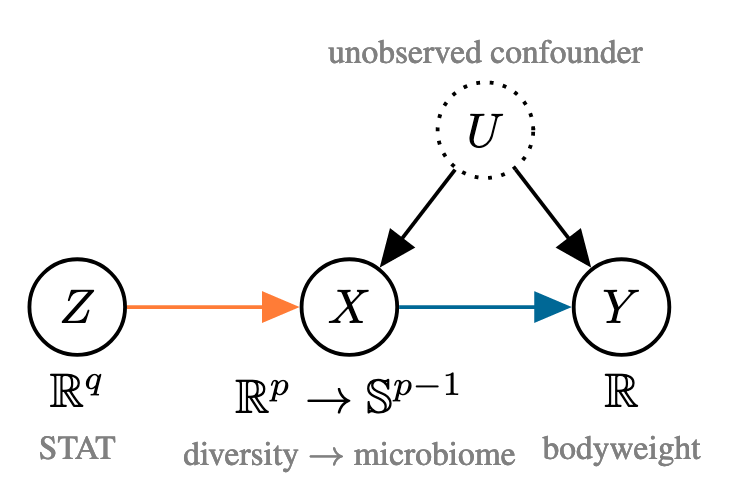



<div class="alert alert-block alert-info">
<b>Note:</b>    
    
We chose a notebook format so the input we generated can be replaced, changed and customized to anyone's liking. The methods can be used separately and they can be applied in different compositional contexts.


 
</div>


# Loading of libraries

In [2]:
# STANDARD LIBRARIES
import sys
import os
sys.path.append(os.path.join(os.getcwd(), "../src"))
import jax
import jax.numpy as np
import numpy as onp
import skbio.stats.composition as cmp
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import statsmodels.api as sm
from datetime import datetime
from types import SimpleNamespace


# SPECIFIC FUNCTION FILES
# data simulation
from parameter_settings import simulate_data, return_parameter_setting
from simulate_data_fct import sim_IV_ilr_linear, sim_IV_ilr_nonlinear

# methods function file
from helper_fct import diversity
from run_methods_all import run_methods_confidence_interval, run_methods_all, run_diversity_estimation_methods

# plotting functionalities
from plot_fct import update_layout, update_layout_px, colours, plot_ilr_X_vs_Y, plot_mse_results, plot_beta_results, plot_diversity_methods


INFO:absl:Starting the local TPU driver.
INFO:absl:Unable to initialize backend 'tpu_driver': Not found: Unable to find driver in registry given worker: local://
INFO:absl:Unable to initialize backend 'gpu': Not found: Could not find registered platform with name: "cuda". Available platform names are: Host Interpreter
INFO:absl:Unable to initialize backend 'tpu': Invalid argument: TpuPlatform is not available.


# Generation of  Microbiome Dataset

Apart from a real dataset (see other notebooks in the folder), we evaluated our methods on simulated datasets where we have a ground truth available. The functions `return_parameter_setting` and `simulate_data` will reproduce the different setups, including the key that was used in the simulations.


If you have own data available you can skip this step and replace the variables:

- `Z_sim` _instrument matrix_, i.e. antibiotic treatment etc.
- `X_sim` _compositional matrix_, i.e. microbiome data
- `Y_sim` _output matrix_, i.e. weight
- `confounder` _confounding term_
- `X_star` _compositional interventional data_
- `Y_star` _output matrix from interventional data without confounding_


If no other data is available, the box below indicates the different setups and how to get the parameter settings. We unpack the parameter settings in a separate namespace. If you want to make changes to the setup, a simple overwriting of the original parameters is enough, i.e. 

```python
# overwriting from betaT = np.array([6, 4])
param.betaT = np.array([6, 5])

```


<div class="alert alert-block alert-warning">
<b>Note:</b>    
    
In this section we chose from the different setups shown in the paper. We refer to the python file for the individual generation of the data setup.

Here, it is possible to chose between
    
- __Linear, 3 dimensional setup with weak instruments :__ 
       "p3", "linear", "weak"
- __Linear, 3 dimensional setup with strong instruments :__  
       "p3", "linear", "medium"
-__Non-linear, 3 dimensional setup with weak instruments :__  
       "p3", "nonlinear", "strong"
- __Negative Binomial first stage simulation, 20 dimensional setup with strong instruments :__  
       "p20", "negbinom", "unknown"
- __Linear, 20 dimensional setup with strong instruments :__  
       "p20", "linear", "unknown"

 
</div>

## Get parameter settings




In [3]:
# set options for data generation
strDim = "p20"
strRel = "negbinom"
strInst = "unknown"

# get parameter setting which is used in the paper
dictReturn = return_parameter_setting(strDim, strRel, strInst)

# generate namespace for parameters
param = SimpleNamespace(**dictReturn)

# print the parameter setting
print(strDim, strRel, strInst)
param

p20 negbinom unknown


namespace(strDim='p20',
          strRel='negbinom',
          strInst='unknown',
          n=500,
          p=30,
          num_inst=20,
          c_X=2,
          alpha0=DeviceArray([1, 1, 2, 1, 4, 4, 2, 1, 4, 4, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2,
                              2, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 2, 2, 1], dtype=int32),
          alphaT=DeviceArray([[ 0,  0,  0,  0, 10,  0, 10,  0, 10,  0, 10,  0,  0, 10,  0,
                                0, 10,  0,  0,  0,  0, 10,  0,  0, 10,  0,  0, 10, 10,  0],
                              [ 0,  0,  0, 10, 10, 10, 10, 10,  0,  0, 10,  0,  0,  0,  0,
                                0,  0,  0,  0,  0,  0,  0, 10, 10,  0,  0,  0,  0, 10,  0],
                              [10, 10,  0, 10,  0, 10, 10,  0, 10,  0,  0,  0,  0,  0,  0,
                               10, 10,  0, 10,  0,  0,  0,  0, 10, 10,  0,  0,  0, 10,  0],
                              [ 0,  0,  0,  0, 10, 10,  0,  0,  0,  0, 10, 10, 10,  0, 10,
                            

## Simulate data from the parameter settings

In [4]:
confounder, Z_sim, X_sim, Y_sim, X_star, Y_star = simulate_data(dictReturn)

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:464: RuntimeWarning: divide by zero encountered in log
  lmat = np.log(mat)
/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/skbio/stats/composition.py:466: RuntimeWarning: invalid value encountered in subtract
  return (lmat - gm).squeeze()


# Data Visualization

This section is for reproducing the visualizations of the data in the paper.    

We remind that the ternary plots are only feasible for $p=3$.     
The barplot of the microbiome samples is cut off at $6$ to ensure better readability. This, however, can be changed easily.


## Barplot for microbiome visualization $X$

In [5]:
cut_off = 6

if param.p==3:
    fig = px.bar(pd.DataFrame(X_sim[:100, :], columns=["Microbe 1", "Microbe 2", "Microbe 3"]))
    fig = update_layout_px(fig)
    fig.update_xaxes(title="Sample number")
    fig.update_yaxes(title="Percentage of microbiota in sample")
    fig.show()
    
if param.p > cut_off:
    X_plot = np.hstack([X_sim[:, :cut_off], X_sim[:, cut_off:].sum(axis=1).T[..., np.newaxis]])
    fig = px.bar(pd.DataFrame(X_plot[:100, :], columns=["Microbe "+str(i) for i in range(X_plot.shape[1]-1)] + ["Other"]))
    fig = update_layout_px(fig)
    fig.update_xaxes(title="Sample number")
    fig.update_yaxes(title="Percentage of microbiota in sample")
    fig.show()

## Ternary plot for microbiome visualization $X$

In [6]:
# ternary plot for first instrument
if param.p == 3:
    df = pd.DataFrame(X_sim, columns=["Microbe 1", "Microbe 2", "Microbe 3"])
    fig = px.scatter_ternary(df, a='Microbe 1', 
                             b='Microbe 2', 
                             c='Microbe 3',
                             color=Z_sim[:, 0].squeeze(),
                            labels={"color": "Instrument value"})

    fig = update_layout_px(fig)
    fig.show()

In [7]:
# ternary plot for second instrument
if param.p == 3:
    fig = px.scatter_ternary(df, a='Microbe 1', 
                             b='Microbe 2', 
                             c='Microbe 3',
                             color=Z_sim[:, 1].squeeze()
                            ,
                            labels={"color": "Instrument value"})

    fig = update_layout_px(fig)
    fig.show()

## ilr-coordinate plot

ilr-coordinates can be transformed back and forth to the compositional data space by the _Gram Schmidt Basis_ (for example). The transformation function is included in the compositional package of sklearn


In [8]:
# generate ilr coordinates
X_sim_ilr = cmp.ilr(X_sim)
X_star_ilr = cmp.ilr(X_star)

In [9]:
fig = plot_ilr_X_vs_Y(X_sim_ilr, X_star_ilr, Y_sim, Y_star)
fig.update_layout(width=2000, height=500)
fig.show()

# Causal effect of diversity


As the first motivation for looking into compositional data is coming from the---sometimes---misleading diversity measure summary statistic, we include the computation here as well. 

<div class="alert alert-block alert-danger">
<b>Note:</b>    

In this section we look at the plug-in estimate instead of the finer estimation as in[DivNet](https://github.com/adw96/DivNet) and [breakaway](https://github.com/adw96/breakaway) by Amy Willis because of lacking a simulation for the phylogenetic tree.

 
</div>

In [10]:
div_shannon = diversity(X_sim, "shannon")
div_simpson = diversity(X_sim, "simpson")

In [11]:
# Shannon Estimation
x, y, ytrue, xstar, xstar_bound, ystar_ols, ystar_2sls, ystar_kiv, results = run_diversity_estimation_methods(
    Z_sim, div_shannon, Y_sim, Ytrue=Y_star, methods=["OLS", "2SLS", "KIV"])

fig = plot_diversity_methods(x, y, xstar, xstar_bound, ystar_ols, ystar_2sls, ystar_kiv, results, ytrue)
fig.show()

INFO:absl:Setup matrices...


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                 -0.004
Method:                 Least Squares   F-statistic:                    0.8993
Date:                 Di, 03 Aug 2021   Prob (F-statistic):              0.588
Time:                        05:36:15   Log-Likelihood:                -700.25
No. Observations:                 500   AIC:                             1443.
Df Residuals:                     479   BIC:                             1531.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7242      0.437     -1.659      0.0

INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [4.17470243]...
INFO:absl:Optimize xi...
INFO:absl:Optimal xi [6.82484872]...
INFO:absl:Predict treatment effect...


In [12]:
# Simpson Estimation
x, y, ytrue, xstar, xstar_bound, ystar_ols, ystar_2sls, ystar_kiv, results = run_diversity_estimation_methods(
    Z_sim, div_simpson, Y_sim, Ytrue=Y_star, methods=["OLS", "2SLS", "KIV"])

plot_diversity_methods(x, y, xstar, xstar_bound, ystar_ols, ystar_2sls, ystar_kiv, results, ytrue)
fig.show()

INFO:absl:Setup matrices...
INFO:absl:Optimize lambda...


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9954
Date:                 Di, 03 Aug 2021   Prob (F-statistic):              0.466
Time:                        05:36:15   Log-Likelihood:                -699.29
No. Observations:                 500   AIC:                             1441.
Df Residuals:                     479   BIC:                             1529.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.7722      0.436     -1.772      0.0

INFO:absl:Optimal lambda [4.14690186]...
INFO:absl:Optimize xi...
INFO:absl:Optimal xi [7.01353351]...
INFO:absl:Predict treatment effect...


# Causal effect of compositional data

In some cases, the summary statistic of __diversity__ can be misleading. In any case, however, it is sensible to look into the whole microbiome to get a more detailed picture of the causal effects.


This section will run all approaches of the paper in one go. Necessary are the ground truth values `X_star`, `Y_star`, `betaT` as well as the simulated data `Z_sim`, `X_sim` and `Y_sim`. 

The following section then is dedicated to the computation of confidence intervals for the causal effect as shown in the paper.

## Computation of F-Statistic


<div class="alert alert-block alert-info">
<b>Disclaimer:</b>    

For $p > 2$ the F-Statistic of the first stage serves only as a very slight relative indication of instrument strength. 

 
</div>


In [13]:
# Compute F-Statistics 
ZZ_sim = onp.array(sm.add_constant(Z_sim))
alphahat = np.linalg.inv(ZZ_sim.T@ZZ_sim)@ZZ_sim.T@X_sim_ilr
MSM = np.sum(((ZZ_sim@alphahat - np.mean(X_sim_ilr, axis=0))**2), axis=0)/(param.num_inst)
MSE = np.sum(((ZZ_sim@alphahat - X_sim_ilr)**2), axis=0)/(param.n-param.num_inst)
F = MSM / MSE
F

DeviceArray([3.6712258 , 3.852778  , 0.8734664 , 1.3181933 , 2.1089852 ,
             1.0339744 , 2.3552635 , 2.66746   , 2.7704272 , 2.025666  ,
             3.7100453 , 4.9072022 , 1.670175  , 8.962577  , 0.7636841 ,
             1.3159461 , 0.92925036, 1.3308604 , 1.3289593 , 1.520947  ,
             1.1825236 , 1.4891384 , 1.4493378 , 0.66407835, 0.45955646,
             0.5530781 , 0.6655157 , 1.1179436 , 0.59529376],            dtype=float32)

## Causal effect estimation on higher dimensional data

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-2.780e+00  7.000e-01  4.840e+00  6.700e-01 -1.100e-01  6.630e+00
 -2.190e+00  5.810e+00  3.230e+00  4.430e+00  2.710e+00  3.050e+00
  1.028e+01  1.360e+00 -2.200e-01  1.200e-01 -1.000e-01  2.000e-01
 -1.700e-01  4.000e-01 -3.800e-01  8.000e-02  1.000e-02  4.800e-01
 -1.000e-02 -2.000e-01 -2.800e-01 -2.300e-01 -1.300e-01]
Estimated Beta: [ 3.35  7.27  4.46 -0.56  2.88  3.6  -3.66  4.82 -3.39 -1.33 -2.9  -1.51
 -2.09 -9.83 -1.33  0.21 -0.13  0.09 -0.21  0.16 -0.42  0.37 -0.09 -0.02
 -0.51 -0.02  0.17  0.27  0.22  0.13]
Error: 3286.28

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<

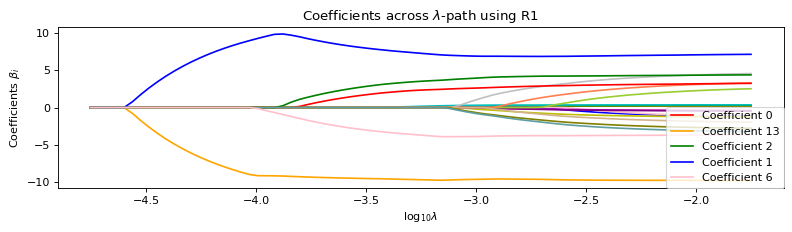

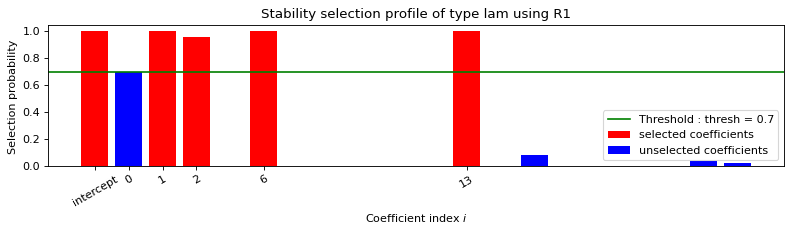

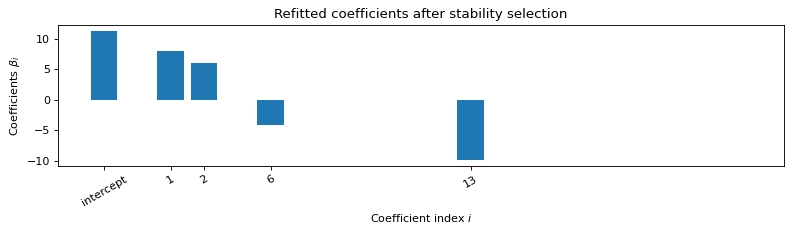


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    6    13    
   Running time :  0.067s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    7.98  6.03  0.    0.    0.   -4.2   0.    0.    0.    0.    0.
  0.   -9.8   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.    0.  ]
Error: 3298.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


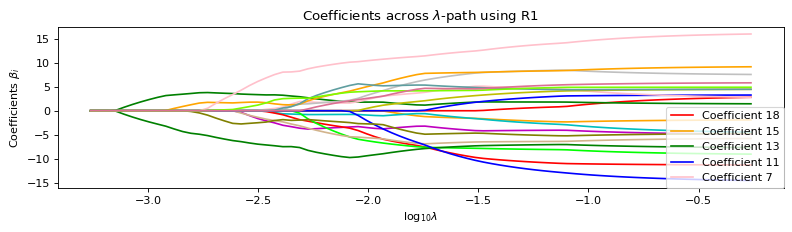

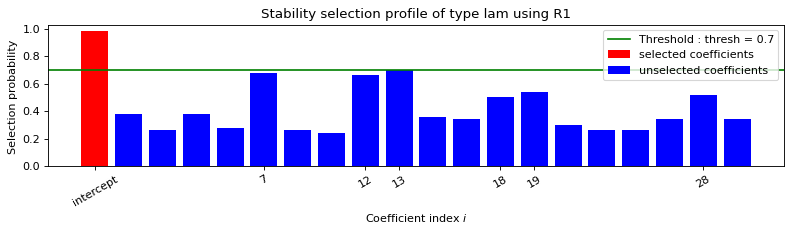

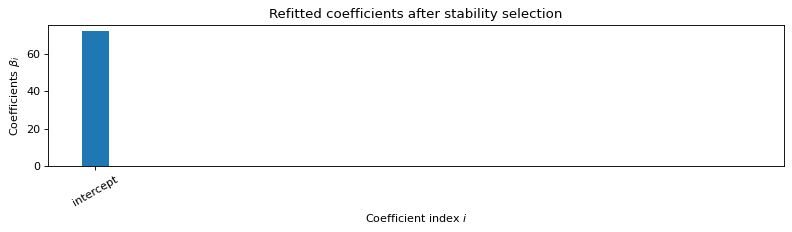


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    
   Running time :  0.173s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0.]
Error: 773.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


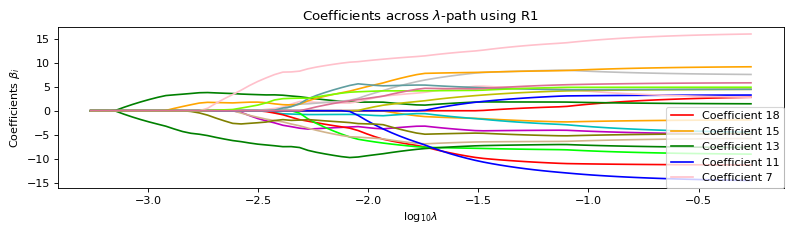

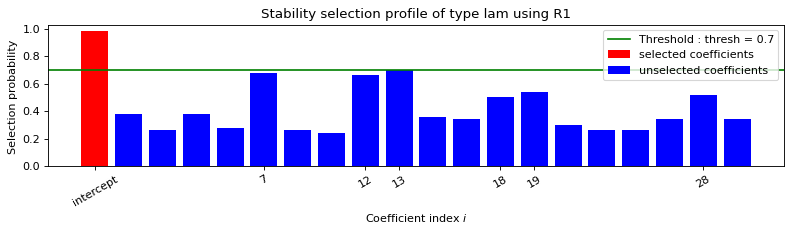

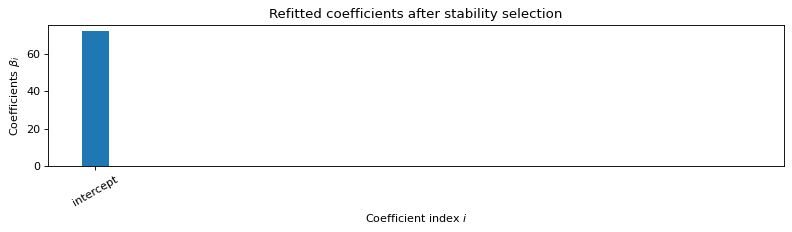

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    
   Running time :  0.204s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0.]
Error: 773.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.95283424]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.65905462]...
INFO:absl:Predict treatment effect...


Error: 752.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3284.45

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2545.99

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>
                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -763.409
Model:                         IV2SLS   Adj. R-squared:               -810.575
Method:                     Two Stage   F-statistic:                -2.153e-15
                        Least Squares   Prob (F-statistic):             

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9



In [14]:
lambda_dirichlet= np.array([0.1, 1, 2, 5, 10])
logcontrast_threshold = 0.7
max_iter = 5

mse_all, beta_all, title_all, mse_large = run_methods_all(Z_sim, X_sim, Y_sim, X_star, Y_star, param.betaT,
                        lambda_dirichlet, max_iter, logcontrast_threshold)

In [15]:
# print results
pd.DataFrame(zip(title_all, mse_all, beta_all), columns=["Method", "OOS MSE", "Beta values"])

,Method,OOS MSE,Beta values
0,ONLY Second ILR,3286.2783,"[-2.7754138741767, 0.6964276871658881, 4.83508..."
1,ONLY Second LC,3298.1636,"[-5.642005, -1.6636117, 4.043184, 3.131837, 2...."
2,ILR+LC,773.1492,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,ALR+LC,773.1492,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,KIV,752.1288,None
5,ONLY Second KIV,3284.4497,None
6,Kernel+Kernel,2545.9924,None
7,ILR+ILR,1076059.5,"[-445.78583, -281.5251, -107.033195, 186.02397..."


# Confidence Intervals for higher dimensional methods

The above only estimated for one sample from the dataset. To get a better overview, we need confidence bands on the OOS MSE and the $\beta$ values.

## Confidence intervals for causal effect estimation

**************************************************************************************************
*****************************************We are at 0 of 20***********************************************
**************************************************************************************************
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY Second Stage - ILR Regression >>>>>>>>>>>>>>>>>>>>>>>>>>>
True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-0.96 -0.99  2.05 -4.03 -1.55  2.87 -1.43  1.7   1.74  0.55  1.84  2.8
  7.23  0.56  2.87  3.36  4.    1.05  3.34  0.94 -1.2   2.73 -0.88  1.87
  1.17  0.83  1.64  2.14  9.42]
Estimated Beta: [ 1.5   2.86  3.39  0.21  6.5   4.59  0.08  4.26  1.12  0.89  1.96  0.56
 -0.59 -5.4   0.98 -1.43 -2.12 -2.98 -0.16 -2.57 -0.28  1.86 -2.1   1.47
 -1.3  -0.66 -0.36

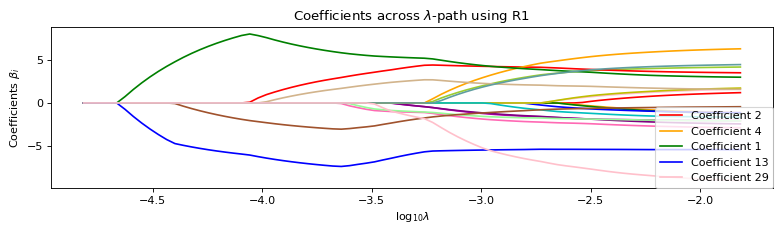

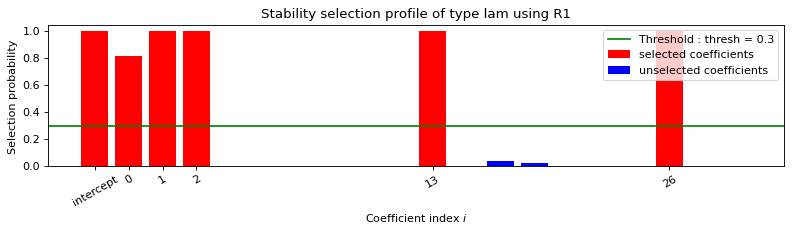

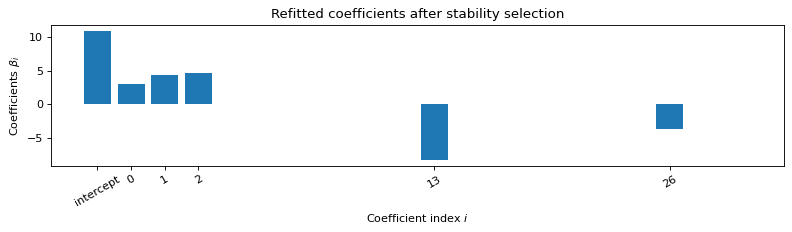


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.073s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.97  4.34  4.59  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -8.2   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -3.7   0.    0.    0.  ]
Error: 4122.56

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


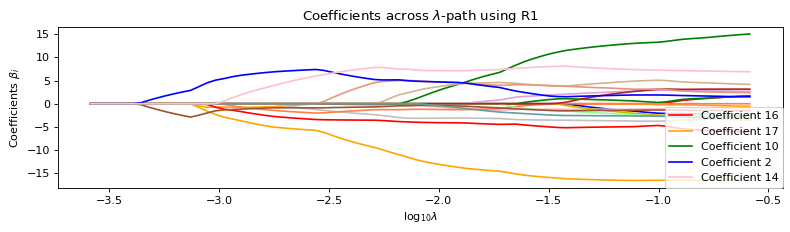

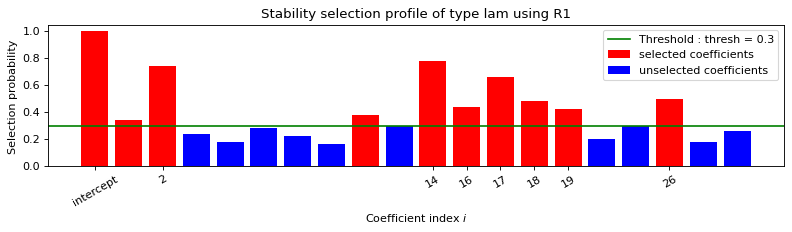

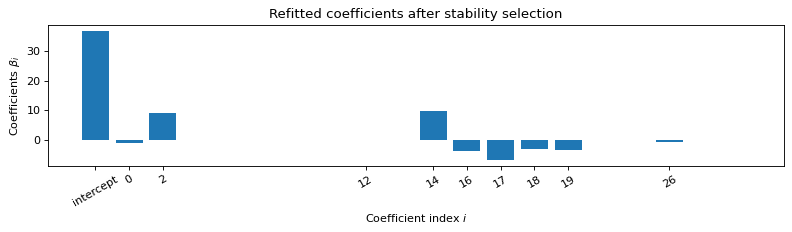


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    2    12    14    16    17    18    19    26    
   Running time :  0.087s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-0.96  0.    9.08  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.08  0.    9.82  0.   -3.86 -6.72 -3.13 -3.38  0.    0.    0.    0.
  0.    0.   -0.92  0.    0.    0.  ]
Error: 3086.66

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


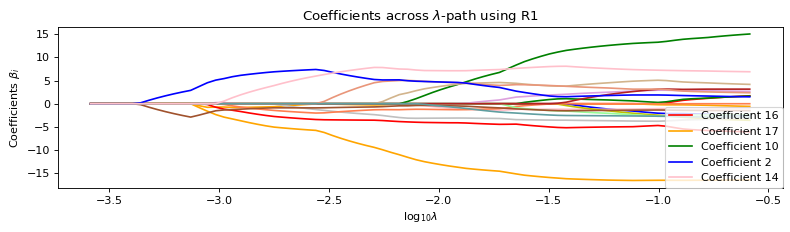

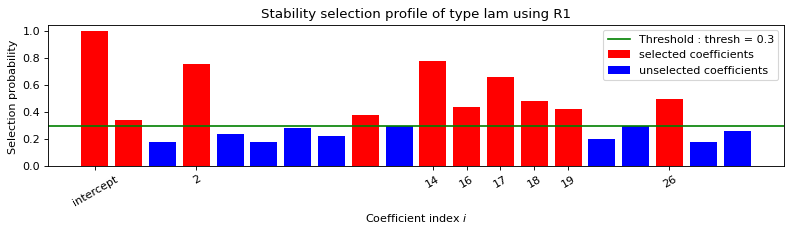

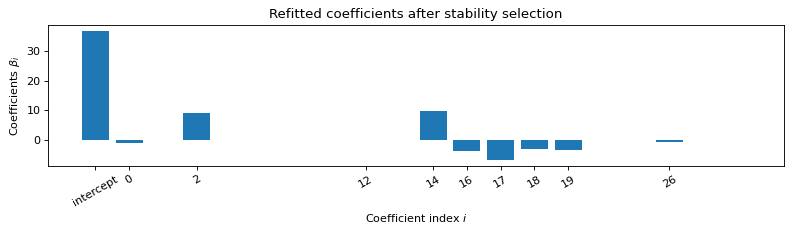

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    2    12    14    16    17    18    19    26    
   Running time :  0.09s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-0.68 -7.8   2.35  1.82  1.48  1.25  1.09  0.96  0.86  0.77  0.71  0.57
  0.61 -8.92  1.16  4.84  7.35  3.45  3.52  0.05  0.04  0.04  0.04  0.04
  0.04  0.94  0.    0.    0.  ]
Error: 3086.88

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.54326344]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99579588]...
INFO:absl:Predict treatment effect...


Error: 1038.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4125.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2802.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -62.591
Model:                         IV2SLS   Adj. R-squared:                -66.515
Method:                     Two Stage   F-statistic:                 -0.003810
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:38:11                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -229.5903   1.86e+09  -1.23e-07      1.0

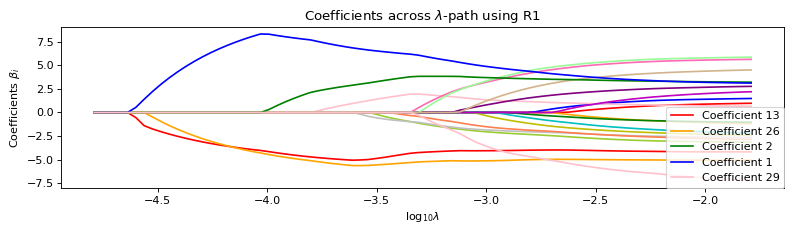

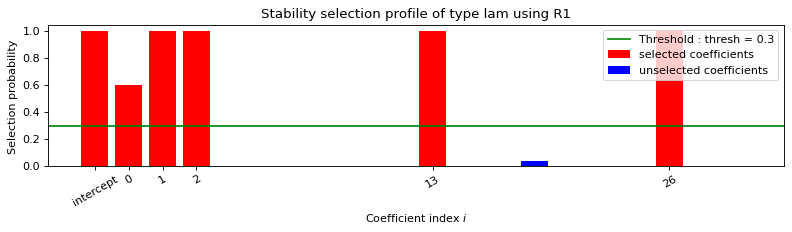

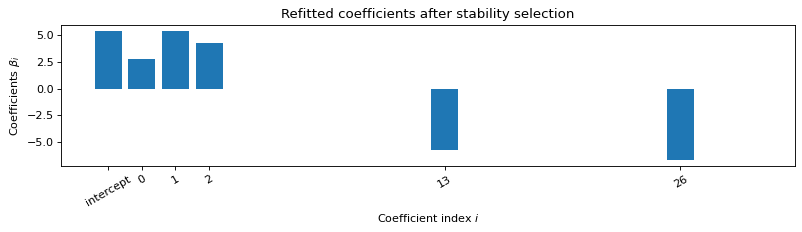


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.049s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.72  5.32  4.26  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -5.7   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -6.59  0.    0.    0.  ]
Error: 4006.81

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


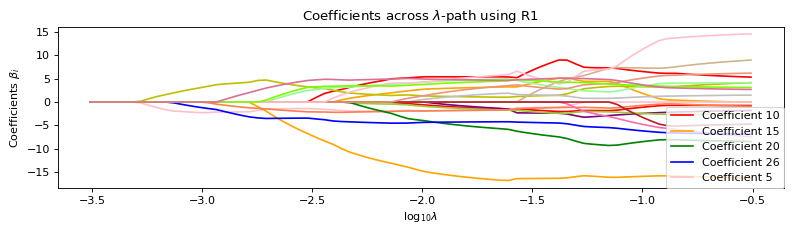

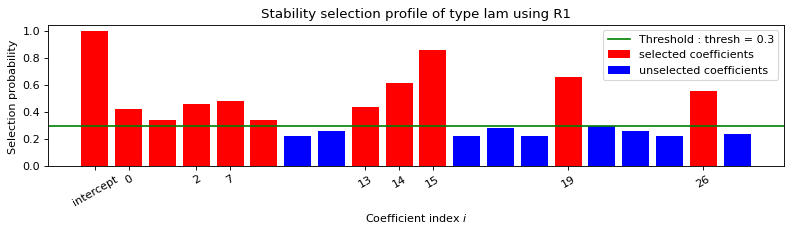

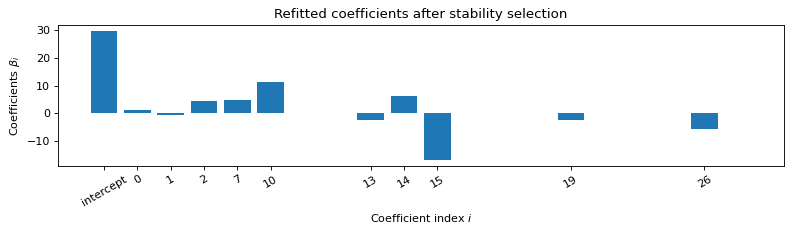


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    7    10    13    14    15    19    26    
   Running time :  0.096s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  1.06  -0.62   4.31   0.     0.     0.     0.     4.96   0.     0.
  11.11   0.     0.    -2.47   6.17 -16.61   0.     0.     0.    -2.34
   0.     0.     0.     0.     0.     0.    -5.57   0.     0.     0.  ]
Error: 2852.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


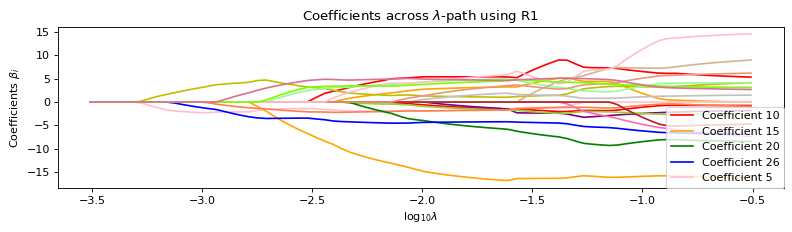

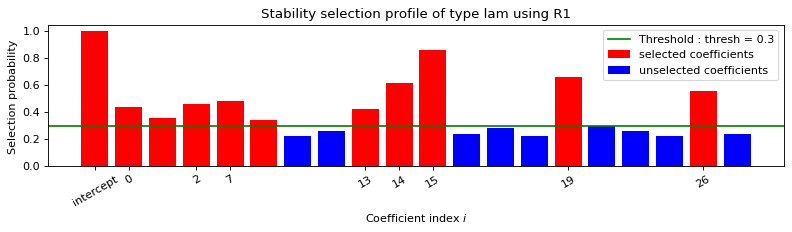

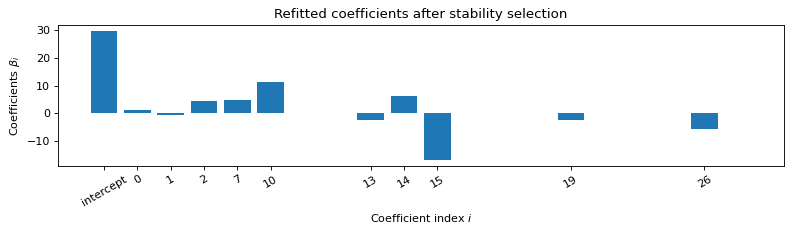

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    7    10    13    14    15    19    26    
   Running time :  0.097s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 1.19 -3.34  1.37  1.06  0.87  0.73 -4.    1.14  1.02 -9.67  1.81  1.67
  3.92 -4.69 17.67  0.48  0.45  0.43  2.69  0.27  0.26  0.25  0.24  0.23
  0.22  5.67  0.    0.    0.  ]
Error: 2852.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.00839378]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-4.00922456]...
INFO:absl:Predict treatment effect...


Error: 1168.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3938.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3067.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -16.348
Model:                         IV2SLS   Adj. R-squared:                -17.418
Method:                     Two Stage   F-statistic:                 -0.001437
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:39:41                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        101.8906   4.91e+08   2.07e-07      1.0

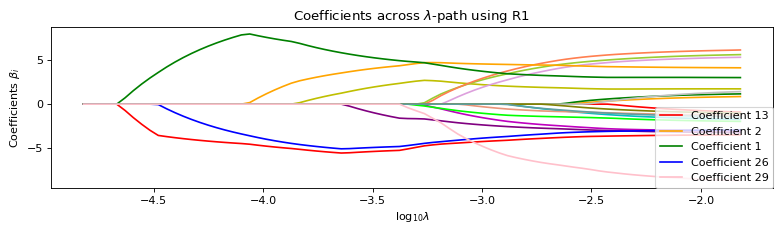

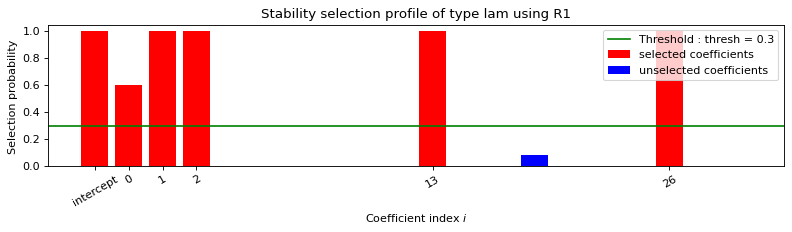

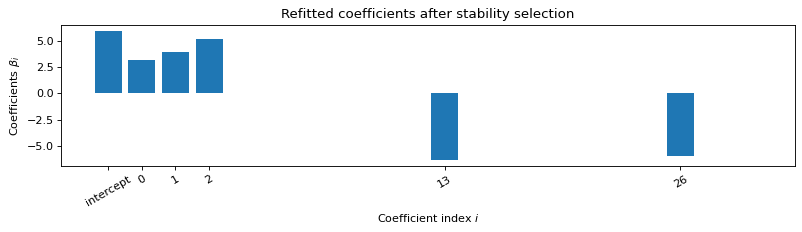


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.051s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.21  3.89  5.14  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.29  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.94  0.    0.    0.  ]
Error: 3371.83

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


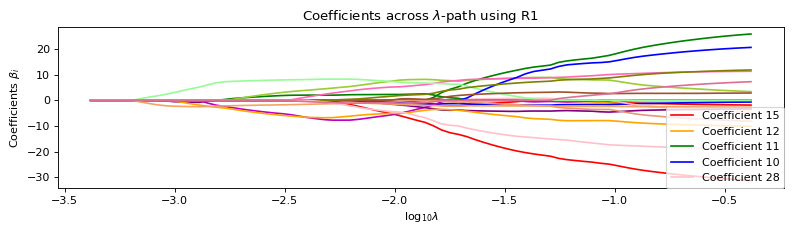

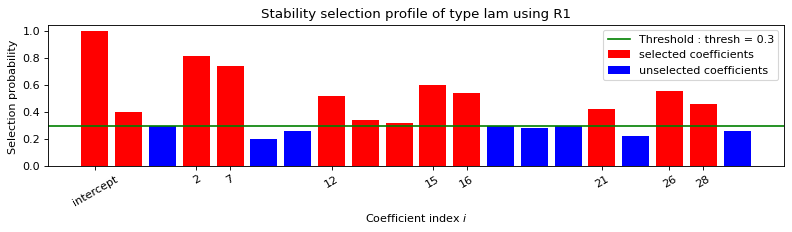

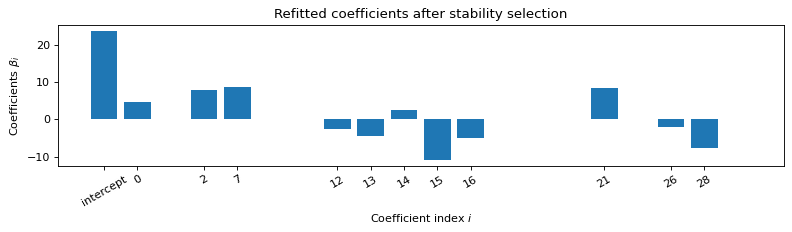


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    2    7    12    13    14    15    16    21    26    28    
   Running time :  0.1s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  4.64   0.     7.97   0.     0.     0.     0.     8.76   0.     0.
   0.     0.    -2.62  -4.5    2.43 -10.75  -4.85   0.     0.     0.
   0.     8.44   0.     0.     0.     0.    -1.93   0.    -7.59   0.  ]
Error: 3680.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


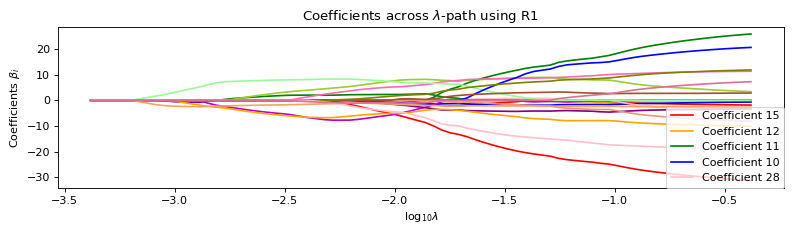

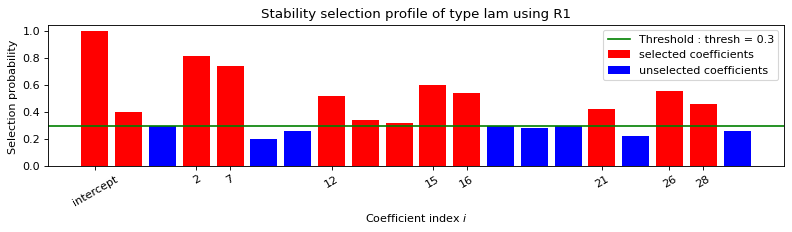

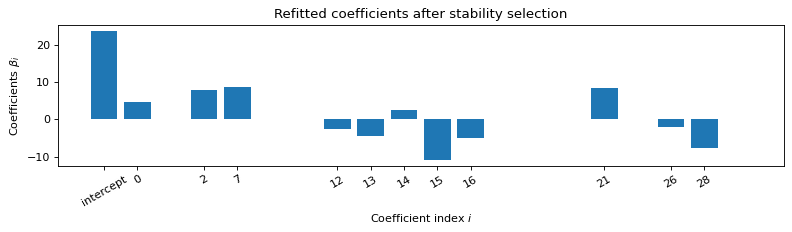

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    2    7    12    13    14    15    16    21    26    28    
   Running time :  0.1s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.28 -4.62  3.64  2.82  2.3   1.95 -6.51  2.52  2.25  2.04  1.86  4.23
  5.73 -1.36 11.48  5.06  0.06  0.06  0.06  0.05 -8.2   0.42  0.41  0.39
  0.37  2.25  0.28  7.73  0.  ]
Error: 3680.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.28246244]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 821.15

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3493.49

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4579.88

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 13

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -71.024
Model:                         IV2SLS   Adj. R-squared:                -75.468
Method:                     Two Stage   F-statistic:                   0.01717
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:41:12                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -98.7351        nan        nan        n

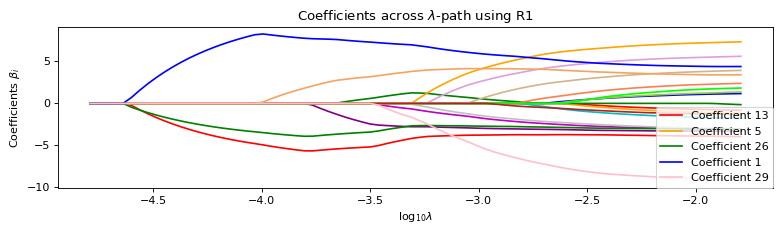

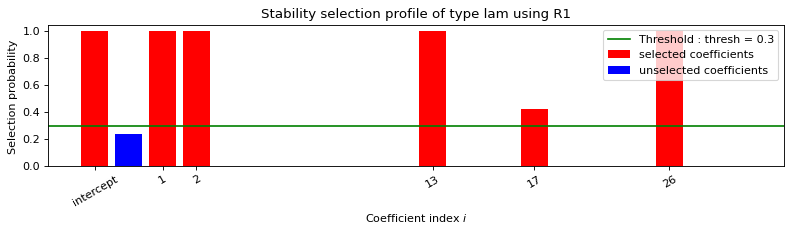

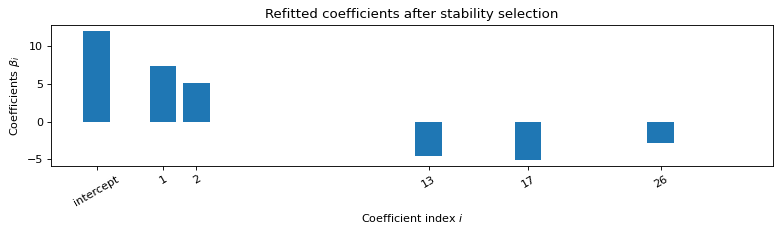


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    13    17    26    
   Running time :  0.06s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    7.35  5.12  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -4.6   0.    0.    0.   -5.01  0.    0.    0.    0.    0.    0.
  0.    0.   -2.85  0.    0.    0.  ]
Error: 3710.34

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


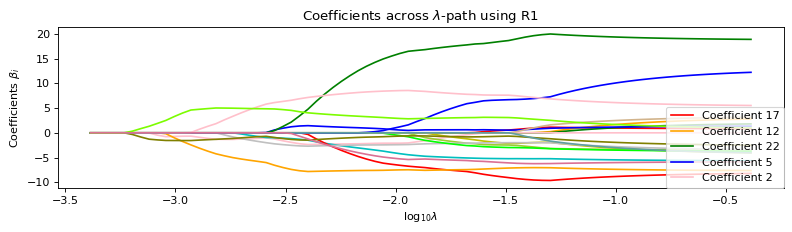

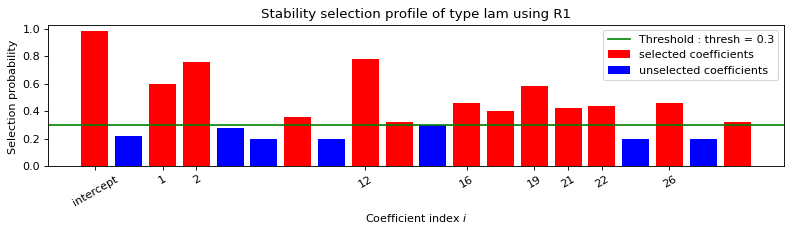

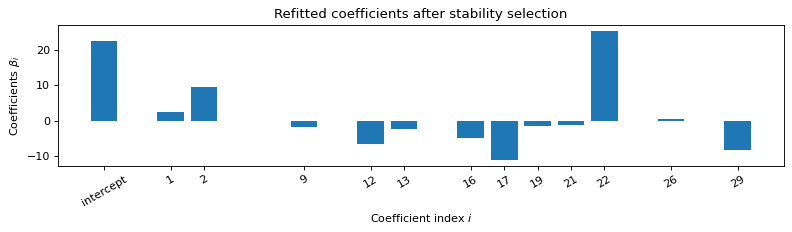


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    9    12    13    16    17    19    21    22    26    29    
   Running time :  0.104s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     2.5    9.68   0.     0.     0.     0.     0.     0.    -1.81
   0.     0.    -6.76  -2.33   0.     0.    -4.96 -11.11   0.    -1.47
   0.    -1.36  25.5    0.     0.     0.     0.37   0.     0.    -8.25]
Error: 2693.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


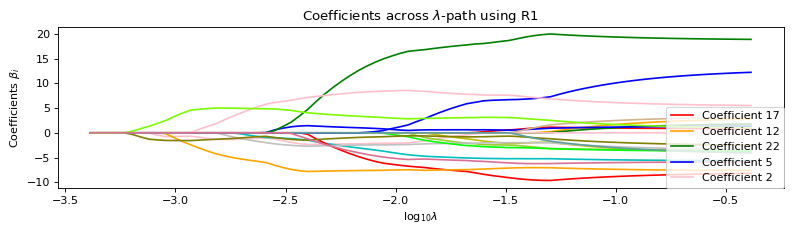

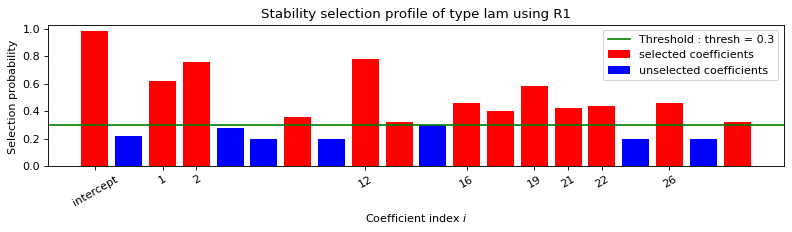

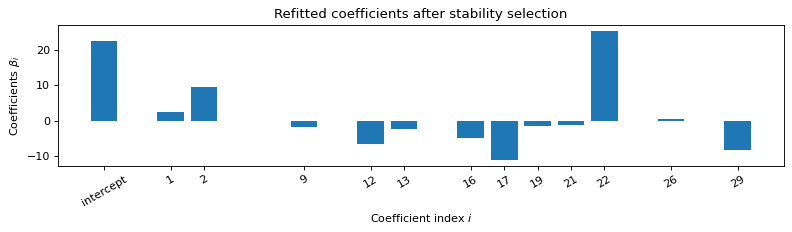

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    9    12    13    16    17    19    21    22    26    29    
   Running time :  0.103s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -1.76  -6.88   3.51   2.72   2.22   1.88   1.63   1.43   3.     0.99
   0.9    7.33   2.51   0.09   0.08   4.88  10.59  -0.8    0.67  -0.79
   0.57 -25.72   0.34   0.32   0.31  -0.06   0.3    0.29   8.4 ]
Error: 2693.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.67067392]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 692.11

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3821.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2802.22

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 13

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                      -6.756
Model:                         IV2SLS   Adj. R-squared:                 -7.235
Method:                     Two Stage   F-statistic:                   0.02410
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:42:41                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -12.5420        nan        nan        n

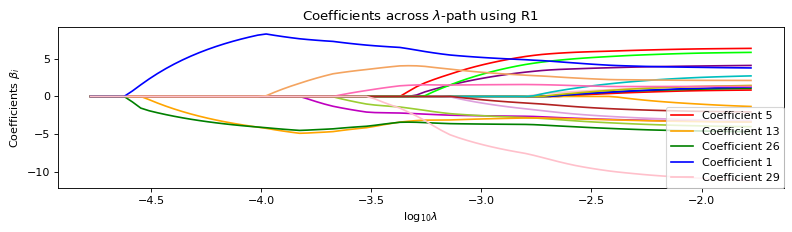

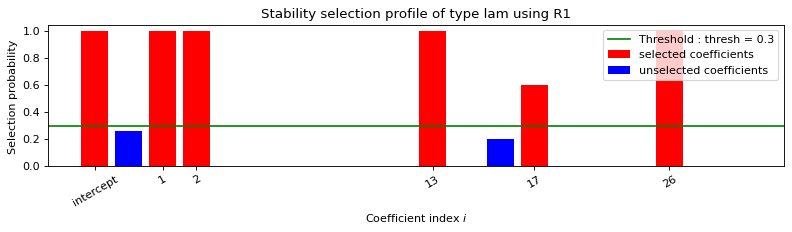

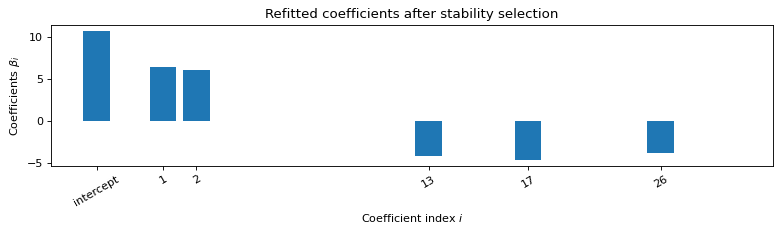


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    13    17    26    
   Running time :  0.052s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    6.49  6.06  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -4.14  0.    0.    0.   -4.6   0.    0.    0.    0.    0.    0.
  0.    0.   -3.8   0.    0.    0.  ]
Error: 3453.28

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


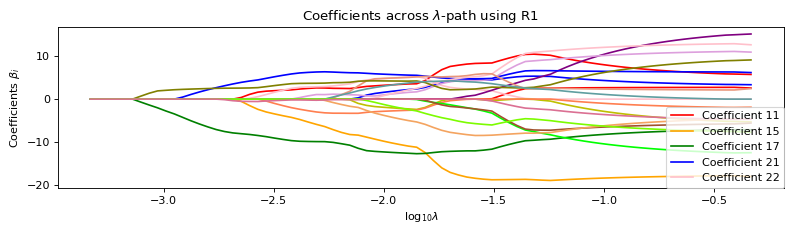

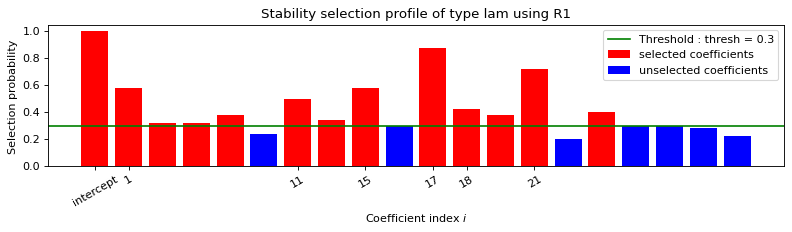

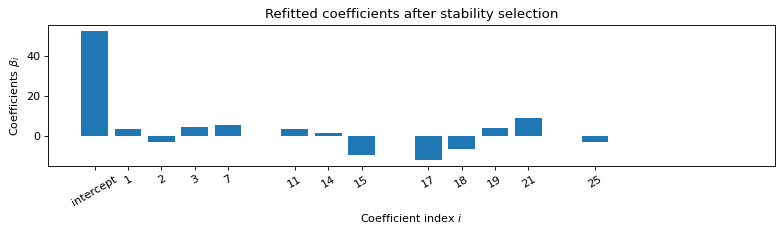


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    3    7    11    14    15    17    18    19    21    25    
   Running time :  0.102s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     3.56  -2.92   4.84   0.     0.     0.     5.68   0.     0.
   0.     3.8    0.     0.     1.77  -9.29   0.   -11.66  -6.46   4.29
   0.     9.07   0.     0.     0.    -2.69   0.     0.     0.     0.  ]
Error: 2399.75

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


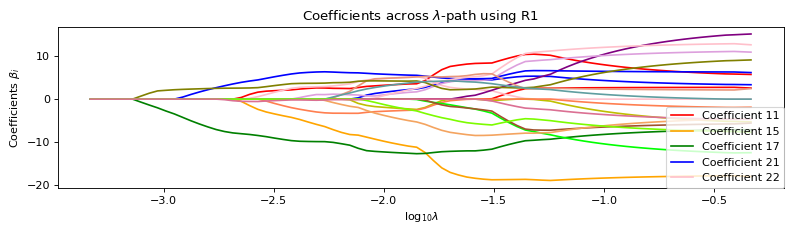

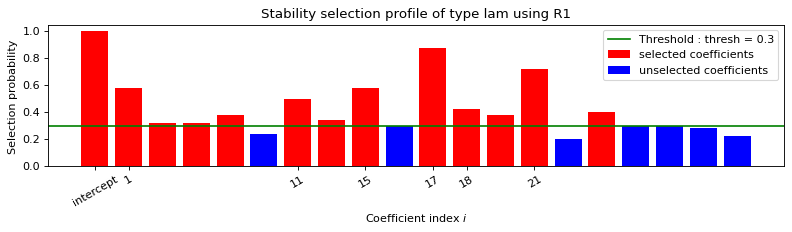

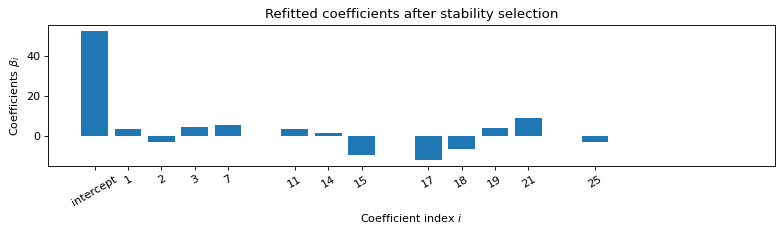

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    3    7    11    14    15    17    18    19    21    25    
   Running time :  0.105s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-2.52  3.84 -4.01  1.23  1.    0.85 -4.58  1.32  1.18  1.06 -2.67  1.2
  1.11 -0.68 10.08  0.45 11.76  6.06 -4.73 -0.31 -9.16  0.12  0.11  0.11
  2.74  0.    0.    0.    0.  ]
Error: 2399.75

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.76637478]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 706.94

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3447.44

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3816.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -10.385
Model:                         IV2SLS   Adj. R-squared:                -11.088
Method:                     Two Stage   F-statistic:                -4.393e-14
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:44:11                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.4089        nan        nan        n

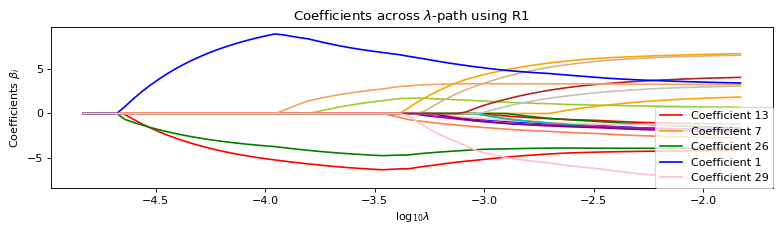

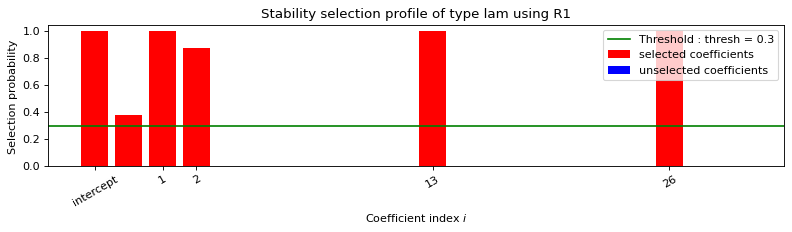

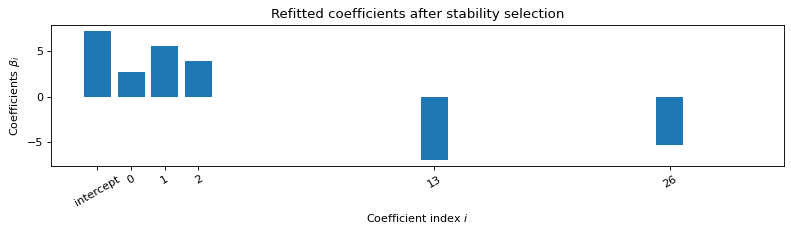


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.05s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.7   5.56  3.9   0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.9   0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.25  0.    0.    0.  ]
Error: 3358.81

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


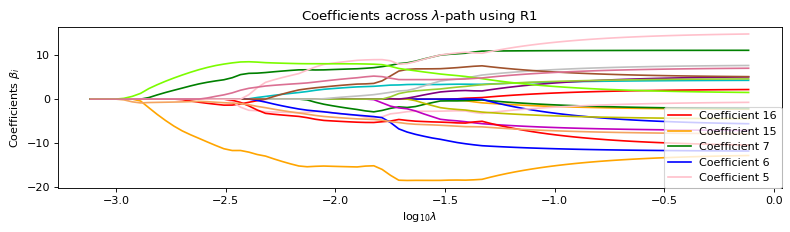

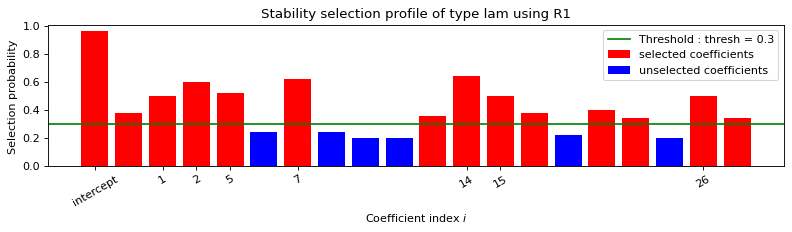

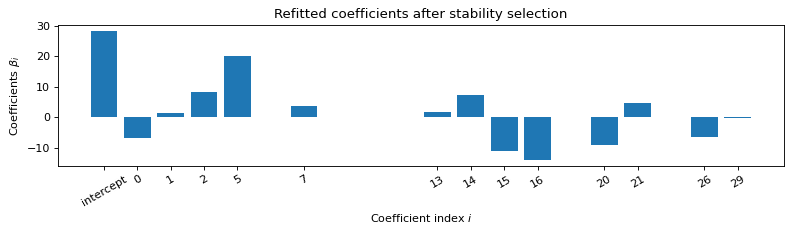


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    5    7    13    14    15    16    20    21    26    29    
   Running time :  0.127s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -6.78   1.57   8.16   0.     0.    20.06   0.     3.84   0.     0.
   0.     0.     0.     1.84   7.45 -11.16 -13.86   0.     0.     0.
  -8.98   4.55   0.     0.     0.     0.    -6.42   0.     0.    -0.27]
Error: 2596.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


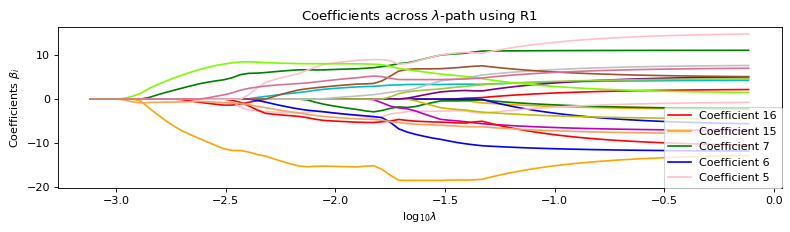

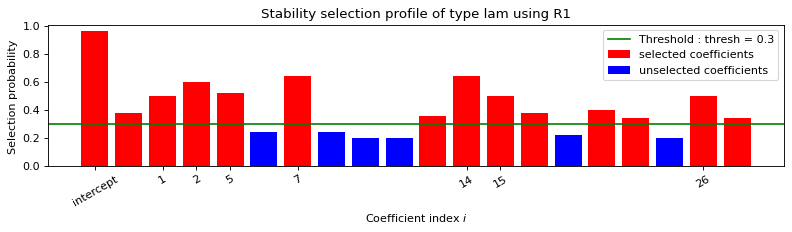

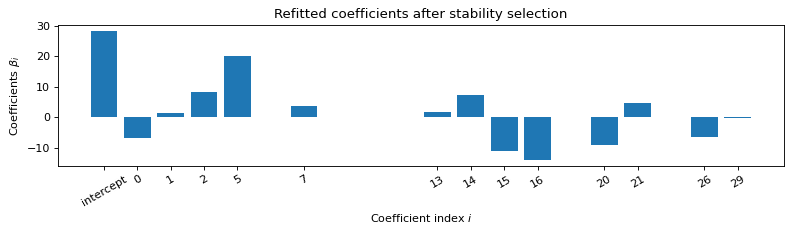

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    5    7    13    14    15    16    20    21    26    29    
   Running time :  0.125s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-5.910e+00 -8.790e+00  8.500e-01  6.600e-01 -1.778e+01  3.550e+00
 -5.200e-01  3.170e+00  2.830e+00  2.560e+00  2.340e+00  2.150e+00
  2.200e-01 -5.210e+00  1.314e+01  1.496e+01  6.400e-01  6.000e-01
  5.700e-01  9.310e+00 -4.350e+00  3.000e-01  2.800e-01  2.700e-01
  2.600e-01  6.550e+00  1.000e-02  1.000e-02  2.800e-01]
Error: 2596.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.20231091]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 722.53

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3381.32

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2878.86

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 13

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                      -5.807
Model:                         IV2SLS   Adj. R-squared:                 -6.227
Method:                     Two Stage   F-statistic:                   0.05803
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:45:41                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         14.8203   2.08e+08   7.12e-08      1.0

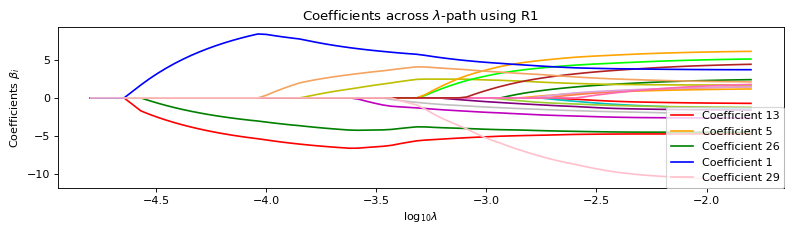

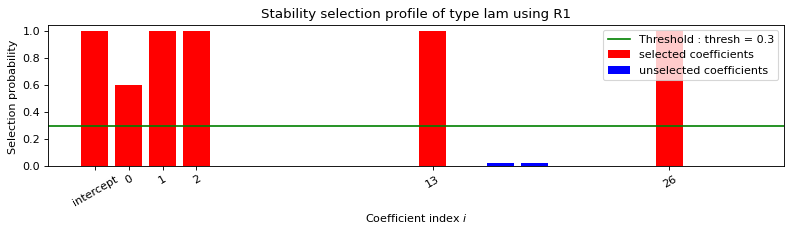

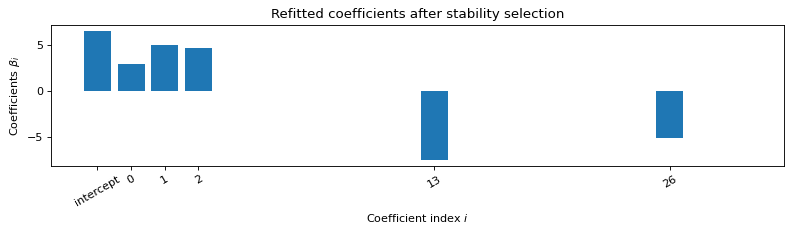


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.048s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.93  4.94  4.64  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.43  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.08  0.    0.    0.  ]
Error: 3790.75

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


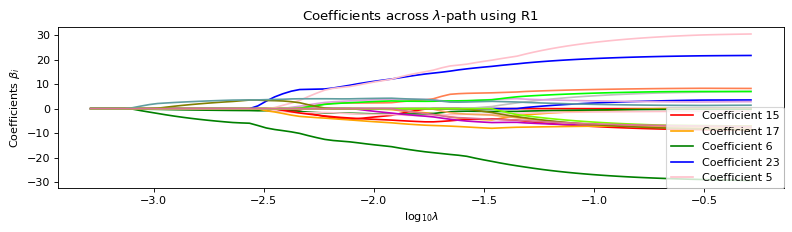

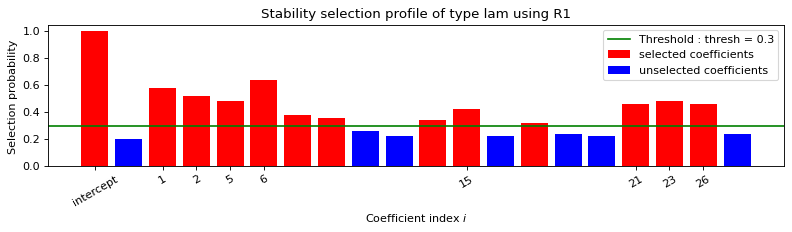

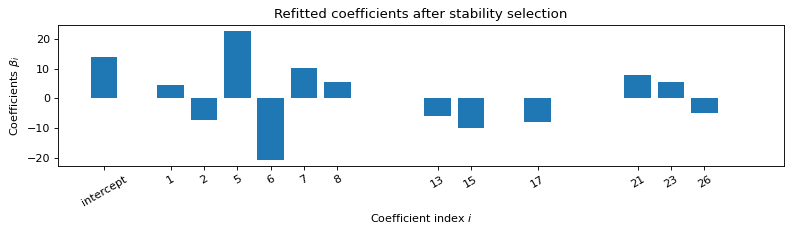


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    5    6    7    8    13    15    17    21    23    26    
   Running time :  0.115s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     4.64  -7.27   0.     0.    22.51 -20.44  10.2    5.44   0.
   0.     0.     0.    -5.74   0.    -9.99   0.    -7.89   0.     0.
   0.     7.93   0.     5.52   0.     0.    -4.92   0.     0.     0.  ]
Error: 3934.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


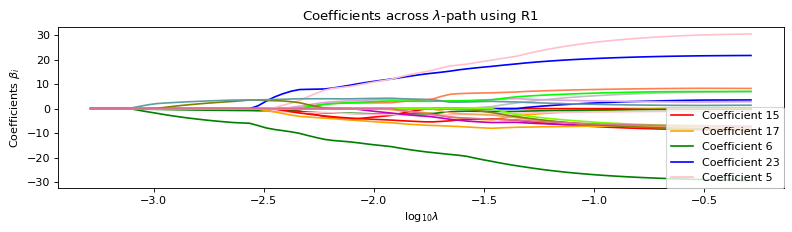

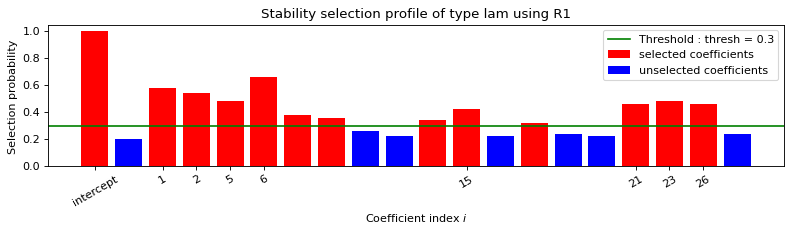

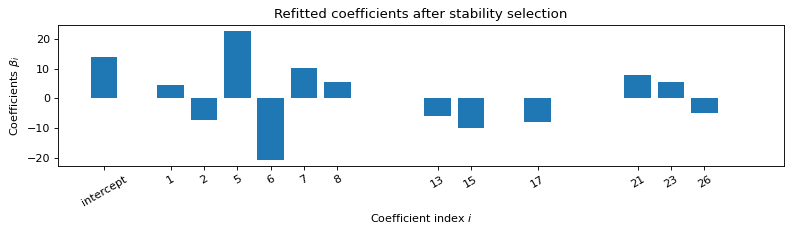

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    5    6    7    8    13    15    17    21    23    26    
   Running time :  0.112s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -3.28   7.83  -0.76  -0.59 -21.03  21.99  -9.62  -3.99   1.59   1.44
   1.31   1.21   6.65   0.65  10.27  -0.04   7.64  -0.46  -0.44  -0.42
  -8.15  -0.03  -5.43   0.2    0.19   5.02   0.     0.     0.  ]
Error: 3934.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.5625096]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 866.24

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3750.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3255.78

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -80.464
Model:                         IV2SLS   Adj. R-squared:                -85.491
Method:                     Two Stage   F-statistic:                 5.055e-16
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:47:11                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.2756        nan        nan        n

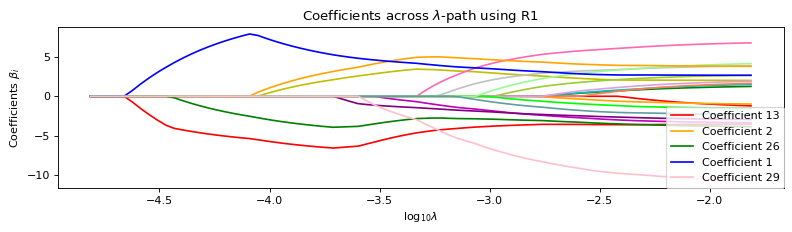

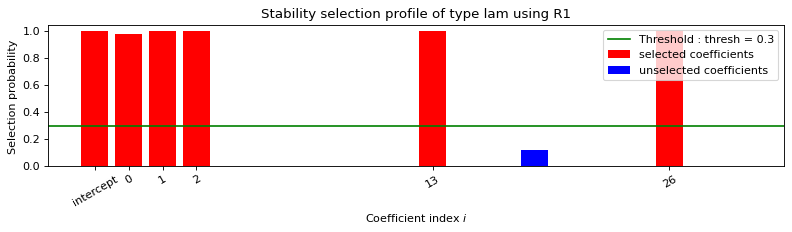

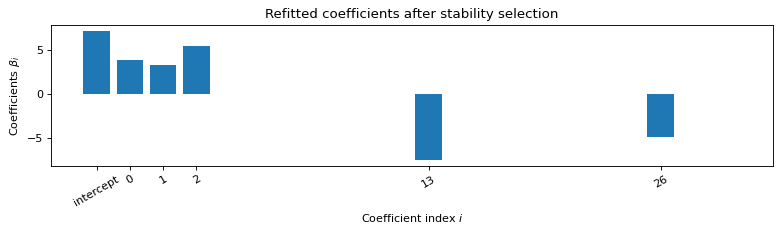


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.057s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.86  3.22  5.36  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.48  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.96  0.    0.    0.  ]
Error: 3046.59

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


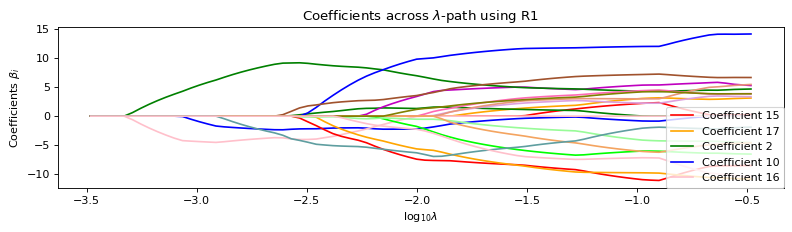

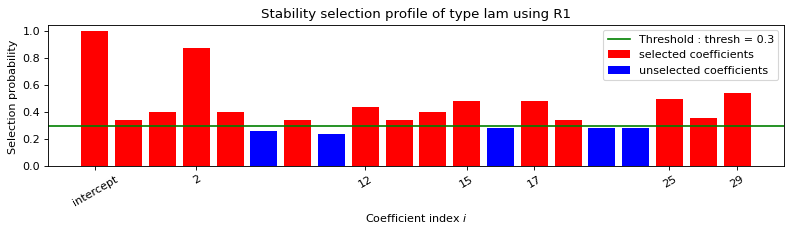

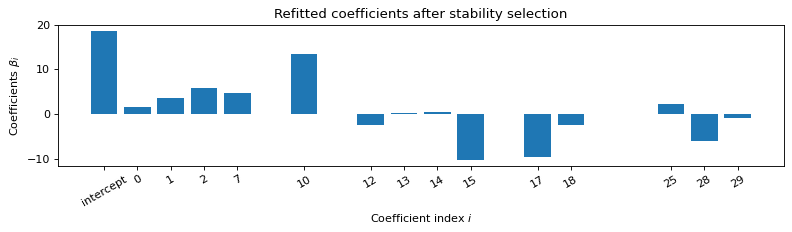


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    7    10    12    13    14    15    17    18    25    28    29    
   Running time :  0.114s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  1.5    3.54   5.81   0.     0.     0.     0.     4.67   0.     0.
  13.4    0.    -2.49   0.16   0.44 -10.2    0.    -9.71  -2.41   0.
   0.     0.     0.     0.     0.     2.18   0.     0.    -5.95  -0.96]
Error: 2826.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


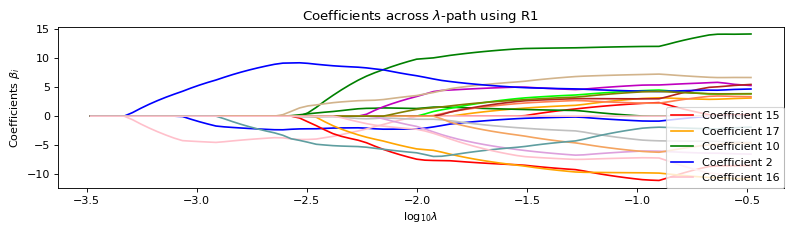

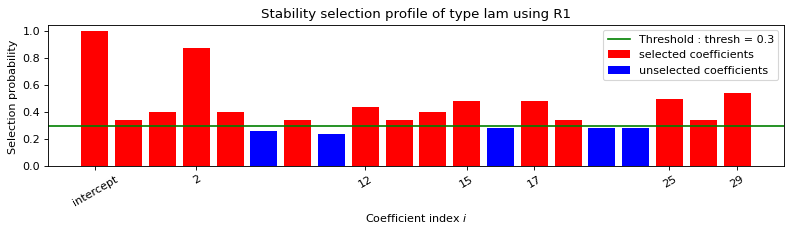

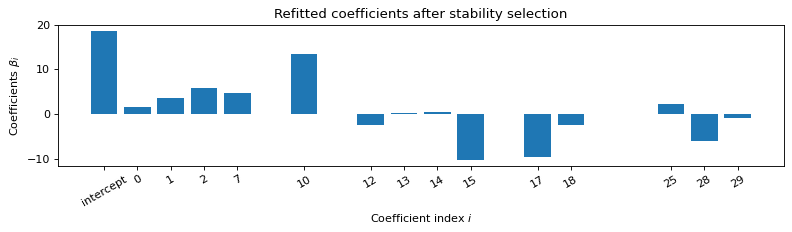

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    7    10    12    13    14    15    17    18    25    28    29    
   Running time :  0.097s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -1.44  -2.69   3.13   2.43   1.98   1.68  -2.92   1.83   1.64 -11.3
   2.52   4.71   1.8    1.41  11.62   1.02  10.4    2.73   0.24   0.23
   0.22   0.21   0.2    0.19  -1.95   0.26   0.25   6.09   0.97]
Error: 2826.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.36775476]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 669.79

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3095.14

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3342.61

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -16.470
Model:                         IV2SLS   Adj. R-squared:                -17.548
Method:                     Two Stage   F-statistic:                 3.043e-05
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:48:44                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         57.4248        nan        nan        n

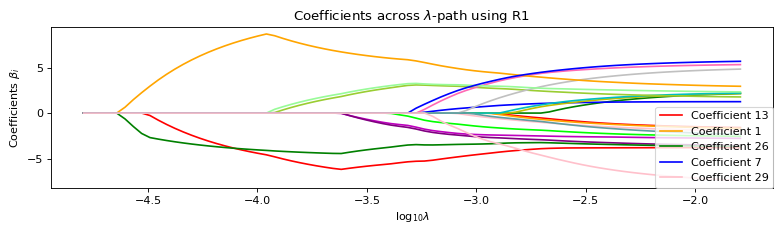

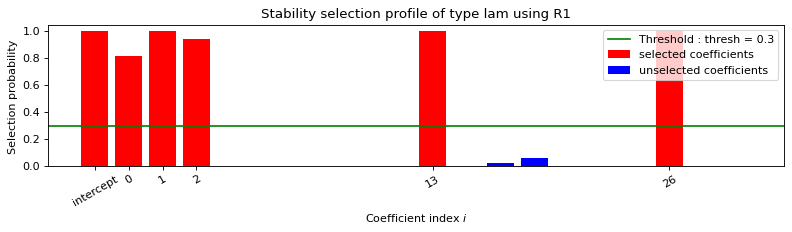

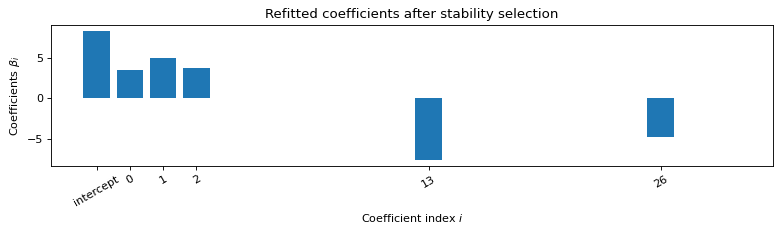


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.075s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.56  4.97  3.82  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.59  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.76  0.    0.    0.  ]
Error: 3376.19

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


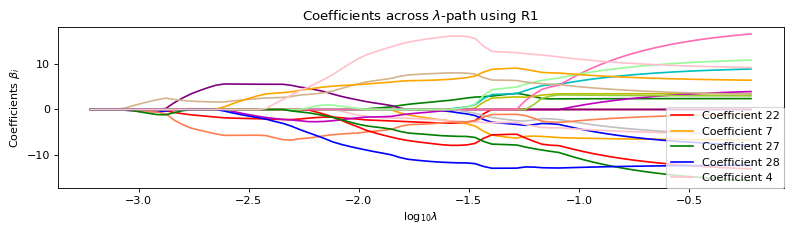

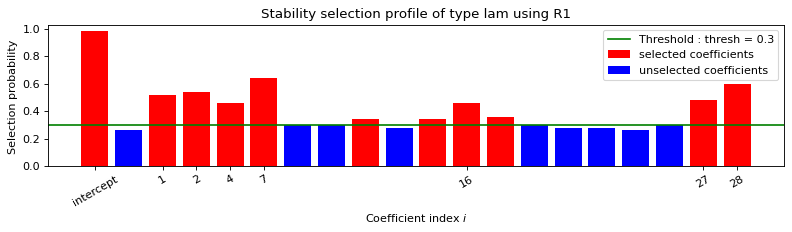

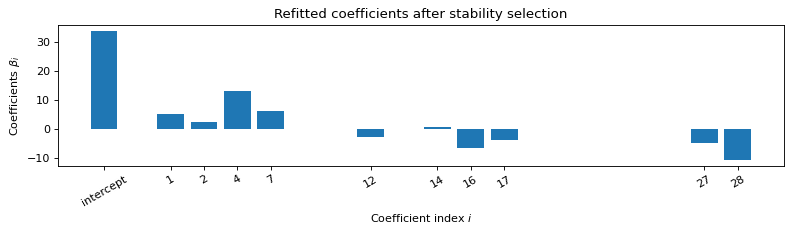


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    4    7    12    14    16    17    27    28    
   Running time :  0.118s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     5.24   2.34   0.    13.29   0.     0.     6.21   0.     0.
   0.     0.    -2.54   0.     0.89   0.    -6.59  -3.75   0.     0.
   0.     0.     0.     0.     0.     0.     0.    -4.69 -10.41   0.  ]
Error: 2617.79

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


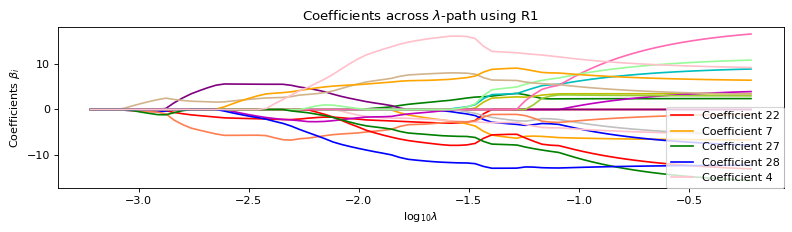

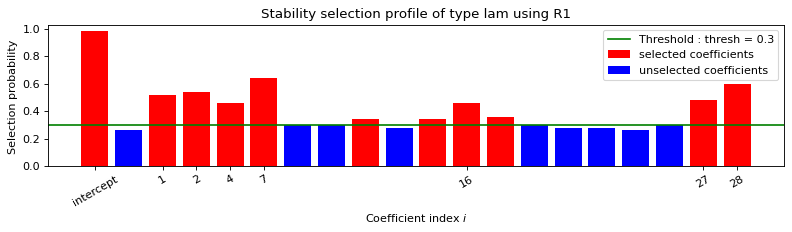

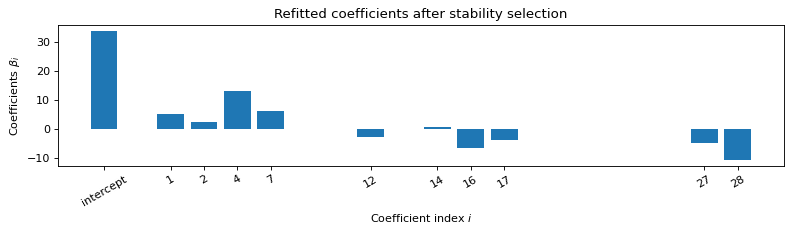

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    4    7    12    14    16    17    27    28    
   Running time :  0.122s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -3.71   0.23   2.19 -10.19   3.81   3.22  -3.02   3.19   2.86   2.58
   2.36   4.61   1.82   0.83   1.64   7.93   4.72   0.82   0.77   0.74
   0.7    0.67   0.64   0.62   0.59   0.57   5.16  10.59   0.  ]
Error: 2617.79

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.38837364]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 648.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3467.41

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2713.63

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 12

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -19.179
Model:                         IV2SLS   Adj. R-squared:                -20.424
Method:                     Two Stage   F-statistic:                   0.05593
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:50:15                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -18.6459   2.07e+08     -9e-08      1.0

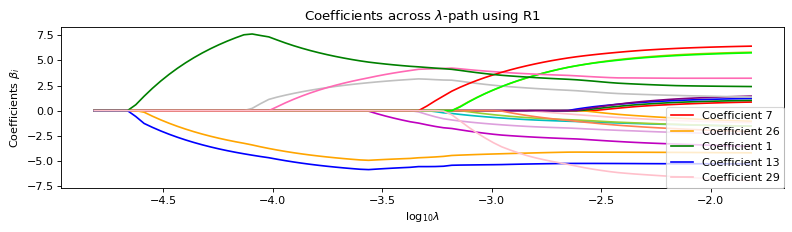

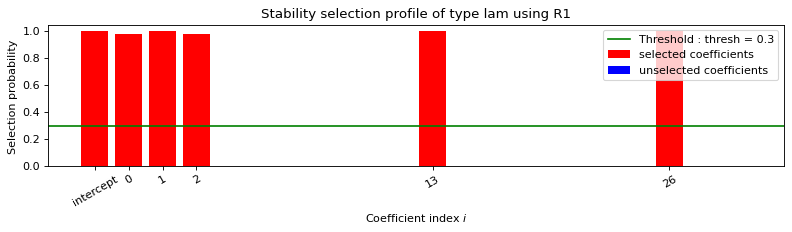

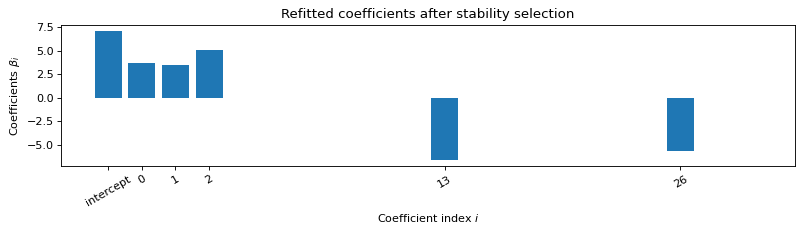


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.057s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.67  3.46  5.04  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.55  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.62  0.    0.    0.  ]
Error: 3310.26

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


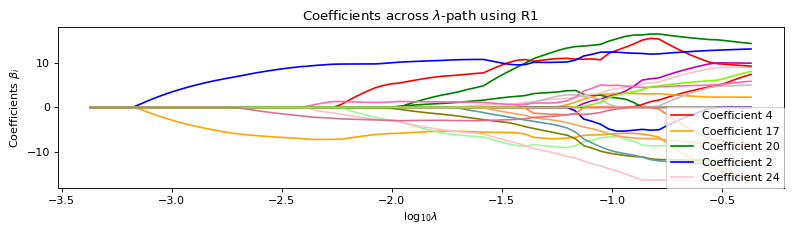

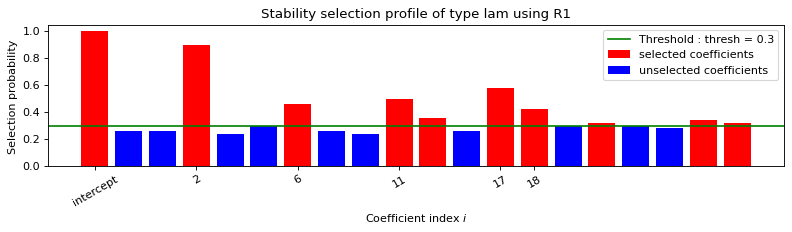

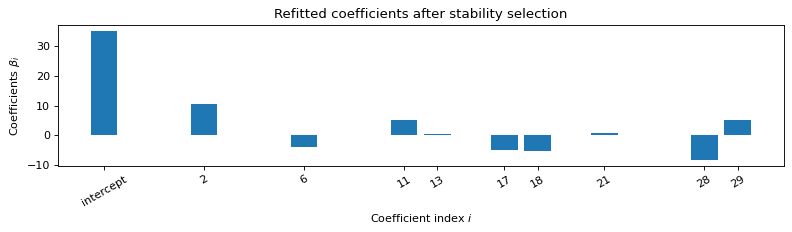


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.009s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    6    11    13    17    18    21    28    29    
   Running time :  0.105s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    0.   10.61  0.    0.    0.   -4.07  0.    0.    0.    0.    5.1
  0.    0.55  0.    0.    0.   -4.84 -5.3   0.    0.    0.88  0.    0.
  0.    0.    0.    0.   -8.16  5.23]
Error: 2495.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


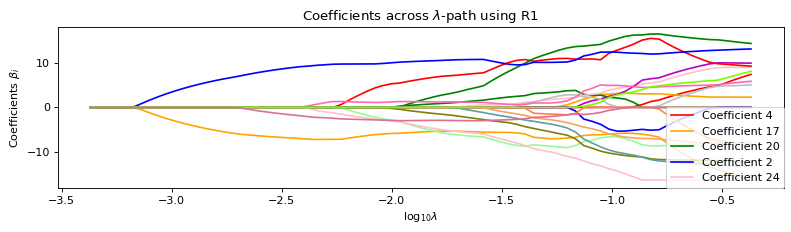

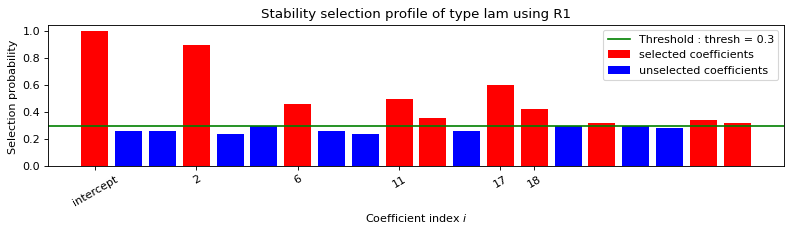

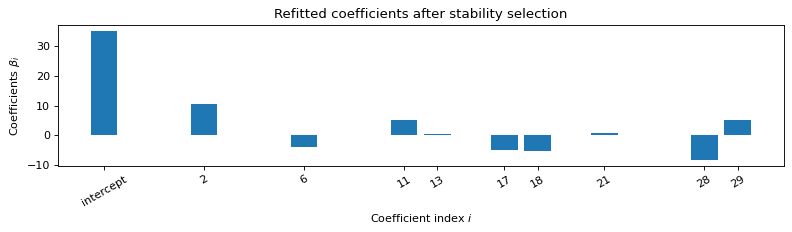

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.011s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    6    11    13    17    18    21    28    29    
   Running time :  0.108s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.   -8.66  3.06  2.37  1.94  5.41  0.87  0.77  0.69  0.62 -4.32  0.93
  0.33  0.84  0.79  0.74  5.4   5.56  0.11  0.1  -0.76  0.13  0.12  0.12
  0.12  0.11  0.11  8.12 -5.32]
Error: 2495.65

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.35791661]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 745.0

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3356.85

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2331.67

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 10

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -271.509
Model:                         IV2SLS   Adj. R-squared:               -288.324
Method:                     Two Stage   F-statistic:                  0.002380
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:51:45                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         57.8270        nan        nan        n

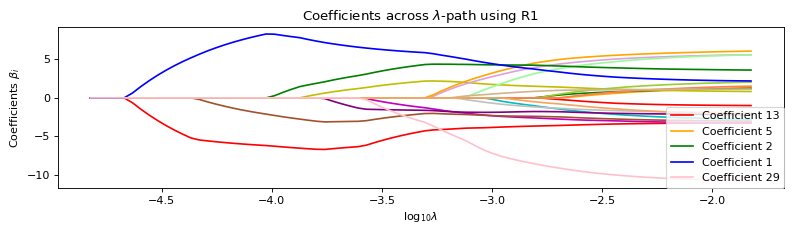

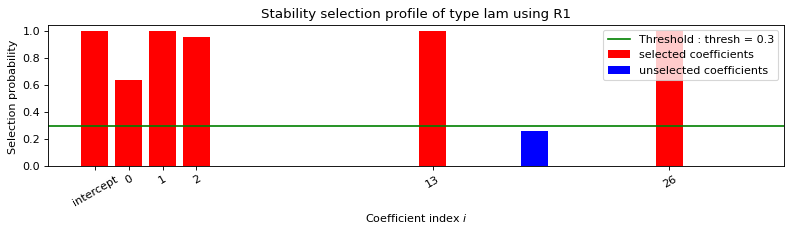

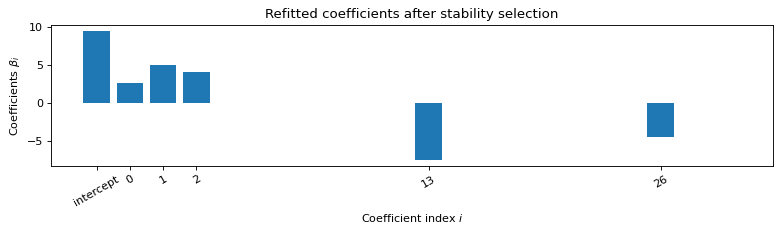


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.051s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.71  5.04  4.14  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.42  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.48  0.    0.    0.  ]
Error: 3610.09

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


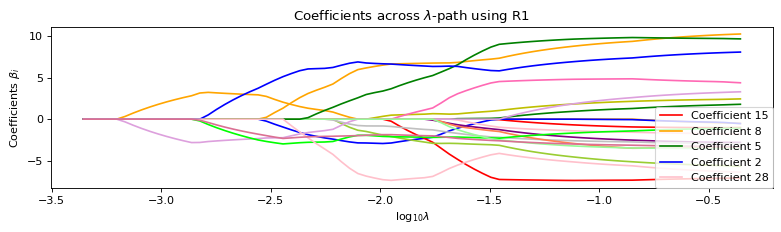

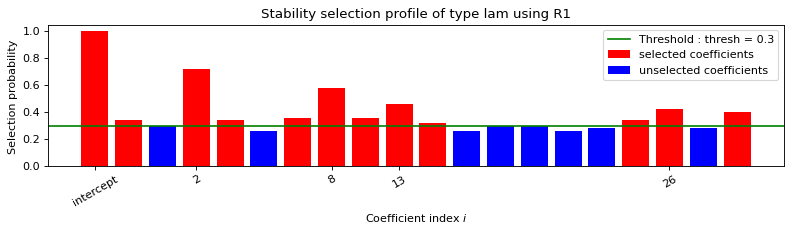

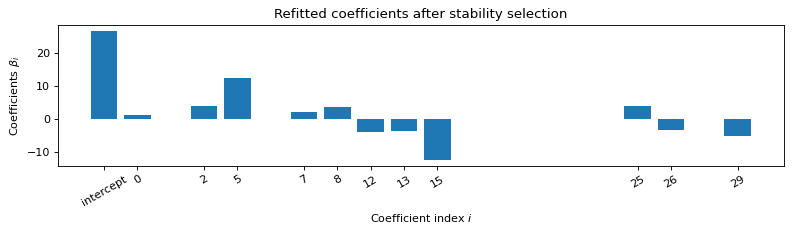


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    2    5    7    8    12    13    15    25    26    29    
   Running time :  0.102s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  1.16   0.     4.     0.     0.    12.52   0.     2.18   3.8    0.
   0.     0.    -3.8   -3.52   0.   -12.15   0.     0.     0.     0.
   0.     0.     0.     0.     0.     3.97  -3.24   0.     0.    -4.91]
Error: 2364.43

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


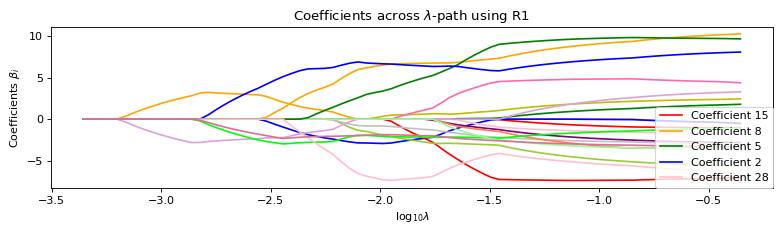

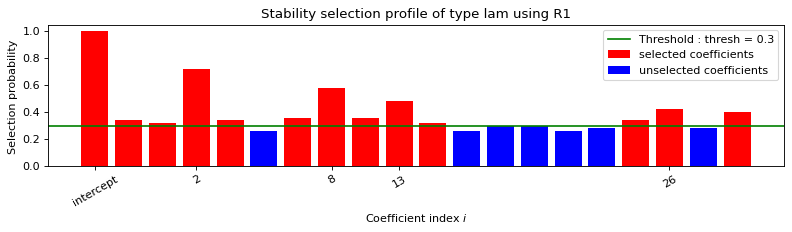

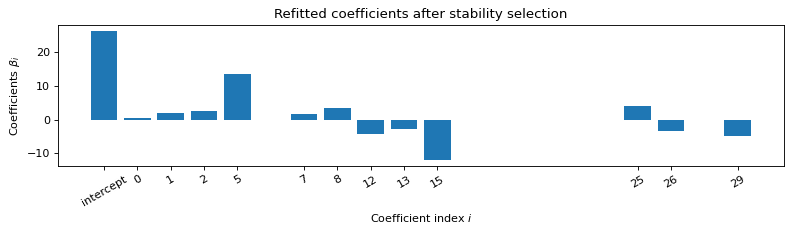

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    5    7    8    12    13    15    25    26    29    
   Running time :  0.108s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ -1.07  -1.21   1.42   1.1  -11.52   2.86   0.98  -0.8    2.47   2.24
   2.04   6.11   4.22   1.12  12.55   0.26   0.24   0.23   0.22   0.21
   0.2    0.19   0.18   0.17  -3.85   3.67   0.18   0.17   5.04]
Error: 2325.31

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.02488009]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-3.67330505]...
INFO:absl:Predict treatment effect...


Error: 1044.69

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3678.86

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2579.58

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 12

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                      -1.627
Model:                         IV2SLS   Adj. R-squared:                 -1.789
Method:                     Two Stage   F-statistic:                  0.001510
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:53:20                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -31.2474        nan        nan        n

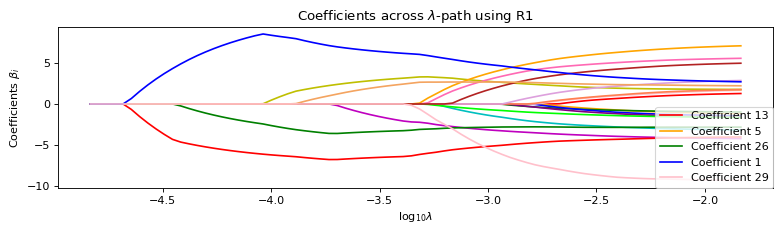

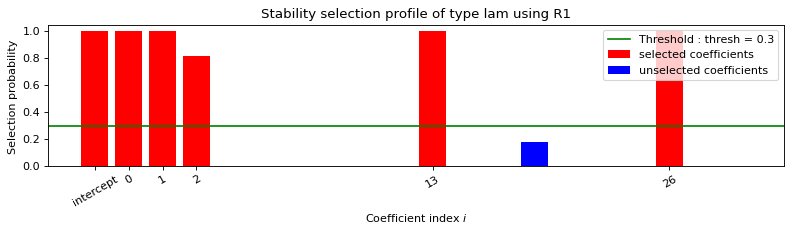

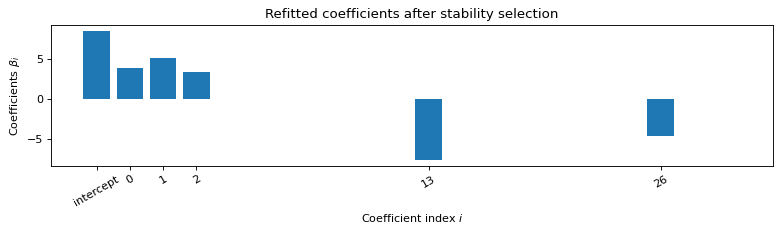


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.054s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.86  5.08  3.27  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.56  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.65  0.    0.    0.  ]
Error: 3185.7

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


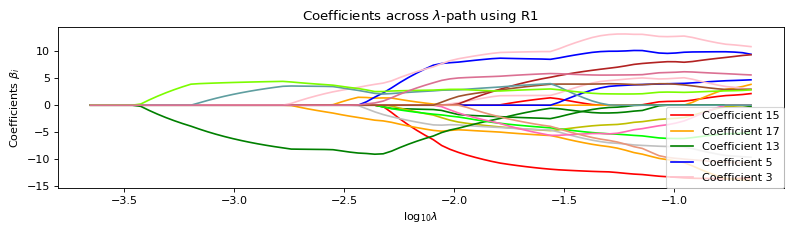

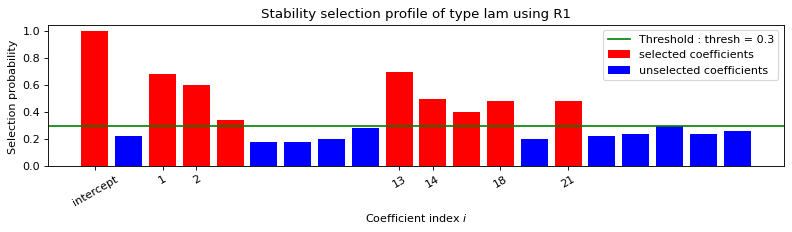

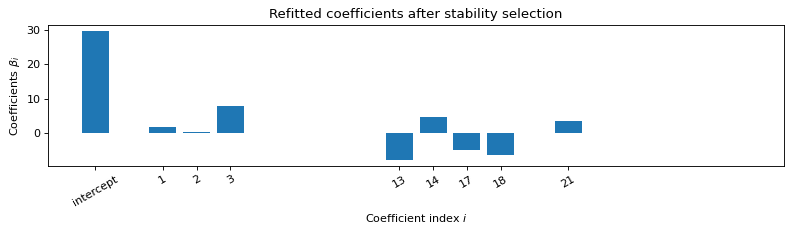


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    3    13    14    17    18    21    
   Running time :  0.088s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    1.7   0.53  7.93  0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.62  4.83  0.    0.   -4.91 -6.17  0.    0.    3.71  0.    0.
  0.    0.    0.    0.    0.    0.  ]
Error: 2431.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


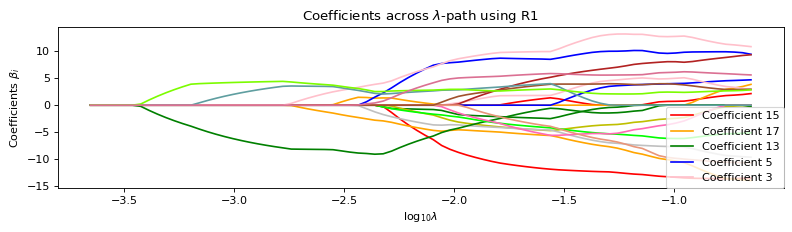

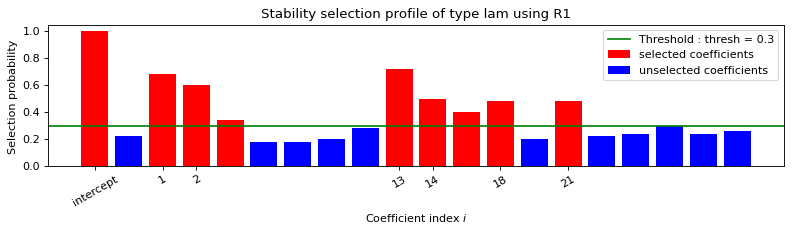

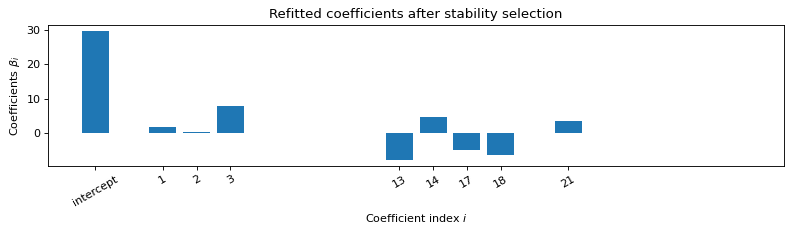

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    3    13    14    17    18    21    
   Running time :  0.078s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-1.21  0.27 -6.22  2.27  1.86  1.57  1.36  1.2   1.07  0.97  0.88  0.81
  8.1  -4.49  0.48  0.45  5.2   6.13 -0.19 -0.18 -3.8   0.    0.    0.
  0.    0.    0.    0.    0.  ]
Error: 2431.62

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.18150847]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573228]...
INFO:absl:Predict treatment effect...


Error: 759.48

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3247.37

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2630.16

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 12

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -13.007
Model:                         IV2SLS   Adj. R-squared:                -13.871
Method:                     Two Stage   F-statistic:                  -0.02601
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:54:53                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        132.9023   2.05e+08   6.47e-07      1.0

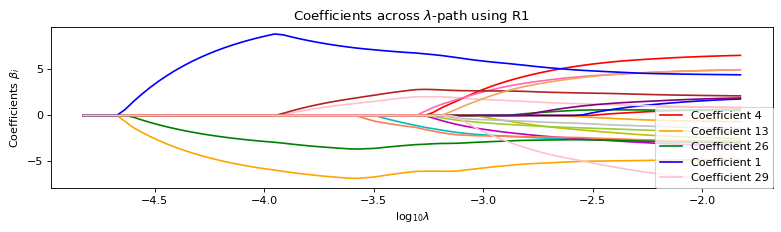

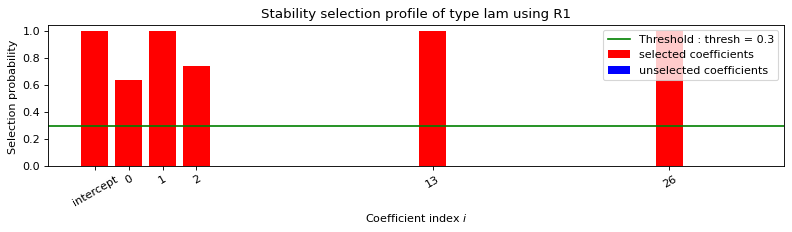

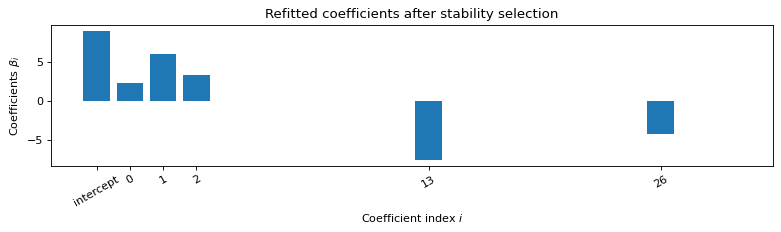


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.048s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.37  6.09  3.35  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.57  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.24  0.    0.    0.  ]
Error: 3710.0

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


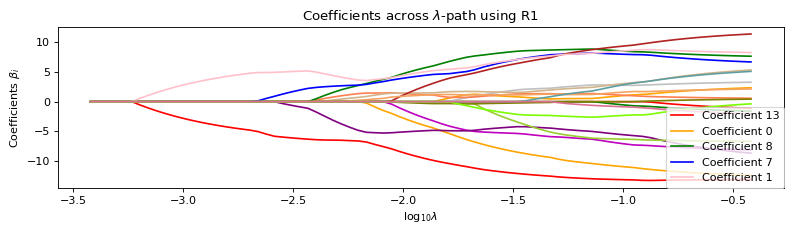

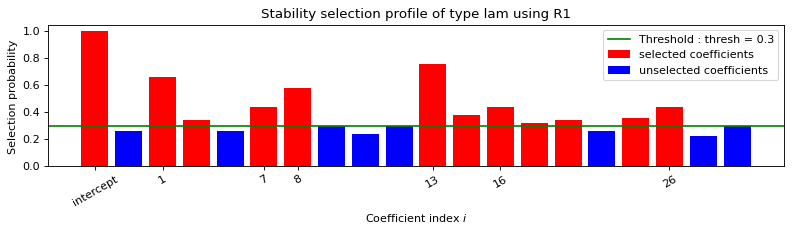

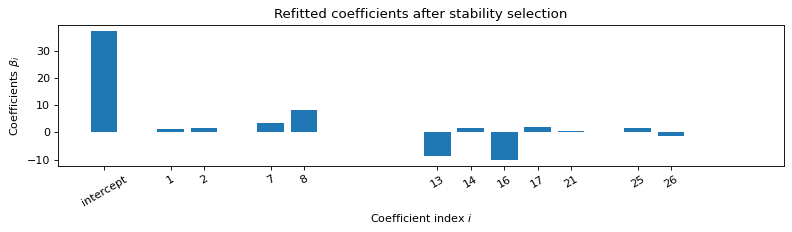


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    8    13    14    16    17    21    25    26    
   Running time :  0.096s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    1.1   1.5   0.    0.    0.    0.    3.42  8.12  0.    0.    0.
  0.   -8.74  1.61  0.   -9.92  2.16  0.    0.    0.    0.37  0.    0.
  0.    1.79 -1.4   0.    0.    0.  ]
Error: 2511.52

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


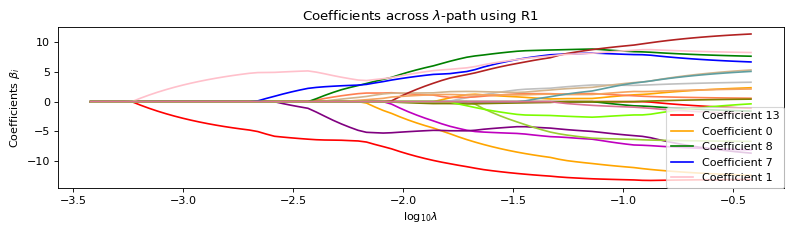

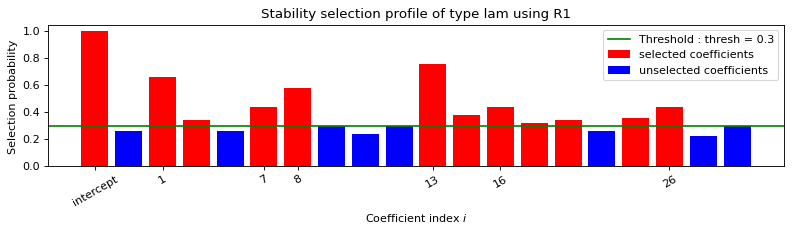

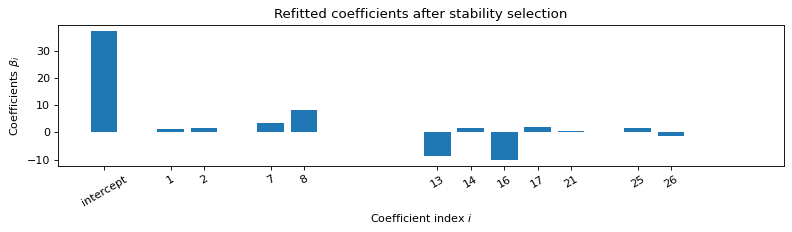

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    8    13    14    16    17    21    25    26    
   Running time :  0.101s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-0.77 -0.78  0.75  0.58  0.47  0.4  -2.85 -6.95  1.49  1.35  1.23  1.13
  9.47 -1.18  0.45 10.05 -2.26 -0.04 -0.04 -0.04 -0.4  -0.02 -0.02 -0.02
 -1.77  1.43  0.    0.    0.  ]
Error: 2511.52

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.06068617]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.87637431]...
INFO:absl:Predict treatment effect...


Error: 830.06

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3690.23

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2794.74

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 11

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -30.062
Model:                         IV2SLS   Adj. R-squared:                -31.979
Method:                     Two Stage   F-statistic:                  -0.01274
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:56:27                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.0103        nan        nan        n

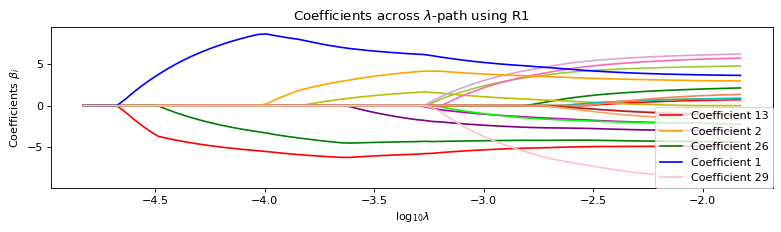

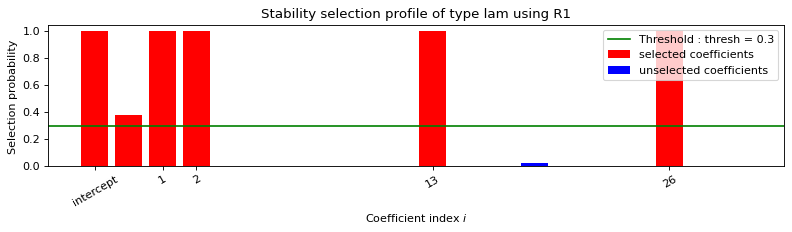

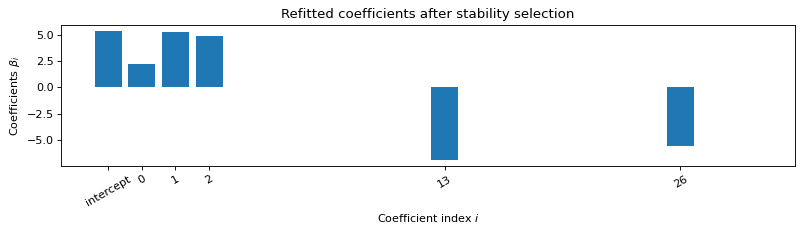


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.048s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 2.24  5.31  4.87  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.88  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.55  0.    0.    0.  ]
Error: 3911.64

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


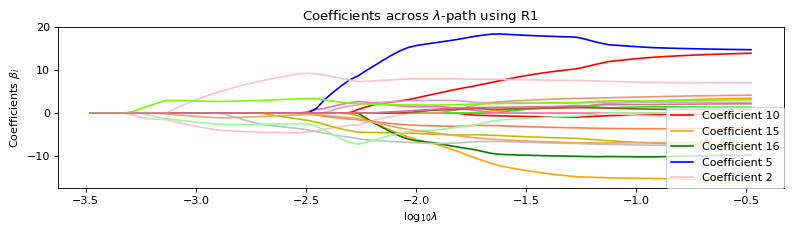

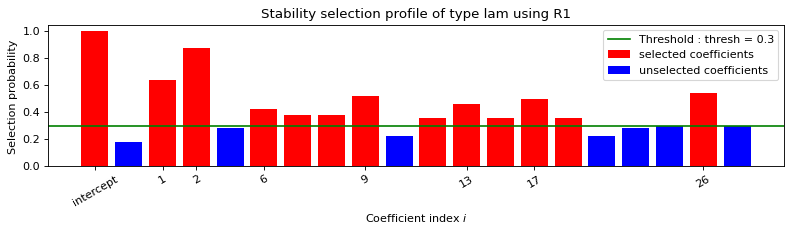

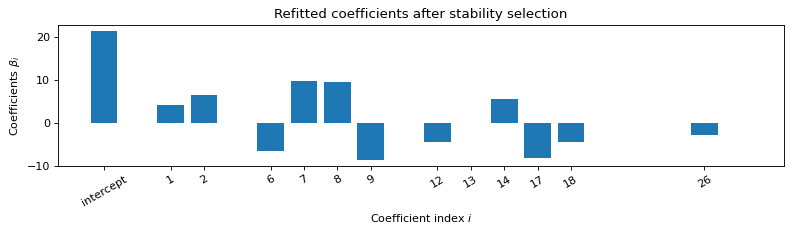


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    6    7    8    9    12    13    14    17    18    26    
   Running time :  0.103s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    4.02  6.54  0.    0.    0.   -6.7   9.68  9.53 -8.58  0.    0.
 -4.54 -0.03  5.53  0.    0.   -8.19 -4.48  0.    0.    0.    0.    0.
  0.    0.   -2.79  0.    0.    0.  ]
Error: 3870.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


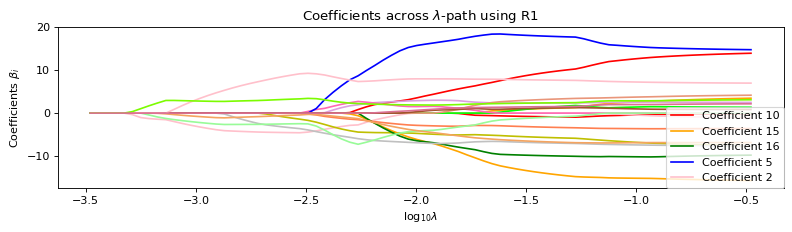

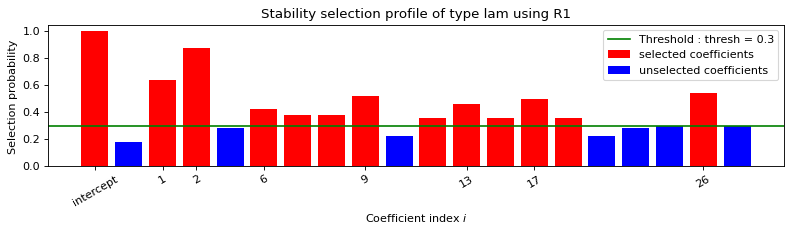

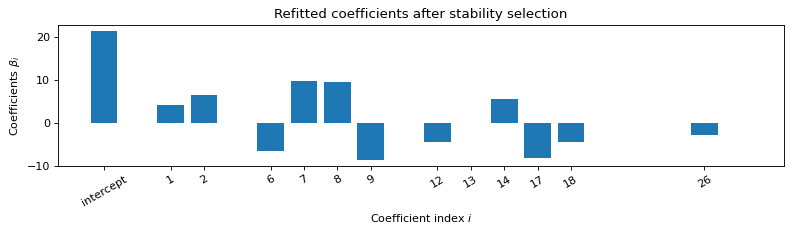

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    6    7    8    9    12    13    14    17    18    26    
   Running time :  0.102s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-2.84 -3.7   3.05  2.36  1.93  7.83 -8.54 -7.39 10.57  1.38  1.26  5.52
  0.77 -4.66  1.    0.94  8.84  4.76  0.14  0.14  0.13  0.12  0.12  0.11
  0.11  2.84  0.    0.    0.  ]
Error: 3870.03

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.25907621]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-4.00557419]...
INFO:absl:Predict treatment effect...


Error: 989.92

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3797.58

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4489.36

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -10.566
Model:                         IV2SLS   Adj. R-squared:                -11.280
Method:                     Two Stage   F-statistic:                   0.01798
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:58:01                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         87.7816        nan        nan        n

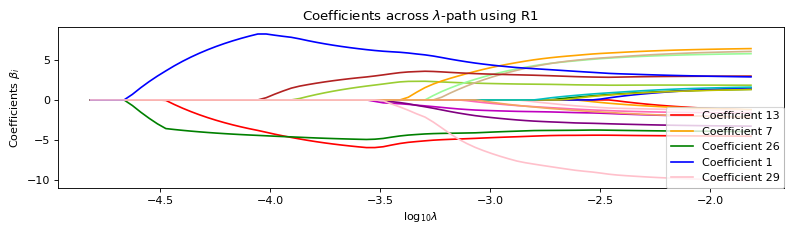

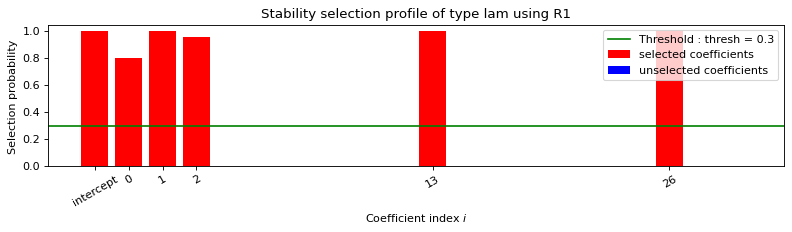

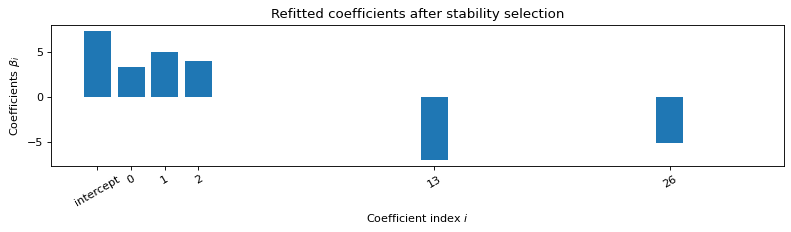


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.048s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.25  4.93  3.98  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.98  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.18  0.    0.    0.  ]
Error: 3356.24

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


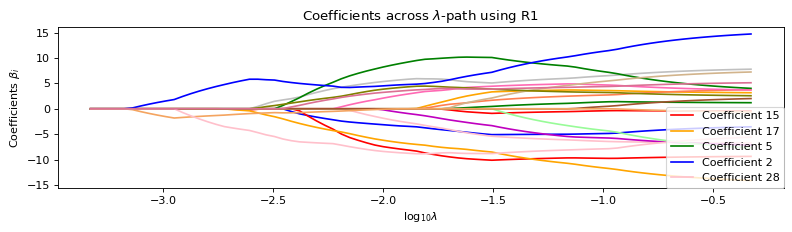

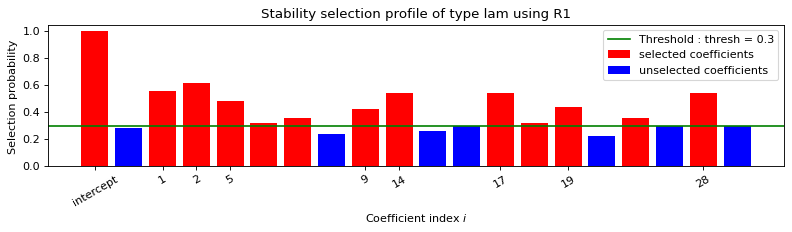

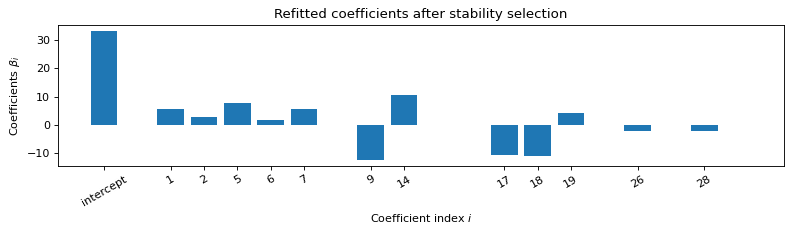


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    5    6    7    9    14    17    18    19    26    28    
   Running time :  0.117s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     5.67   2.92   0.     0.     7.65   1.72   5.62   0.   -12.24
   0.     0.     0.     0.    10.42   0.     0.   -10.78 -10.81   4.22
   0.     0.     0.     0.     0.     0.    -2.21   0.    -2.17   0.  ]
Error: 2777.13

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


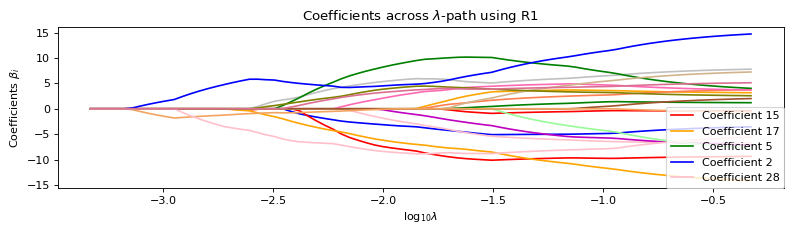

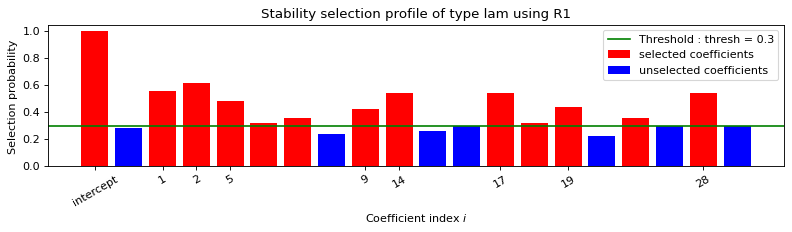

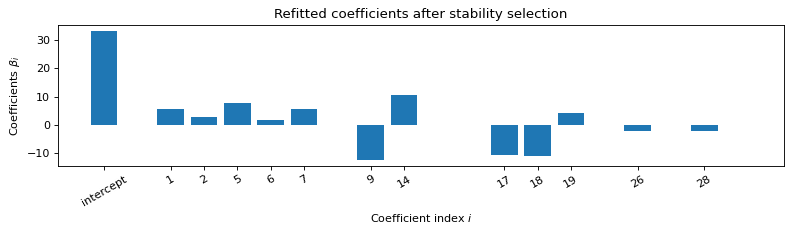

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    5    6    7    9    14    17    18    19    26    28    
   Running time :  0.118s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-4.01 -0.07  2.48  1.92 -5.42  0.92 -2.85  2.78 14.1   1.08  0.99  0.91
  0.84 -9.28  1.4   1.32 11.72 11.12 -4.11  0.21  0.2   0.19  0.19  0.18
  0.17  2.34  0.08  2.21  0.  ]
Error: 2777.0

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [1.7958204]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 773.29

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3433.35

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 2768.12

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 10

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                    -257.028
Model:                         IV2SLS   Adj. R-squared:               -272.949
Method:                     Two Stage   F-statistic:                -2.668e-05
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        05:59:35                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -385.7024        nan        nan        n

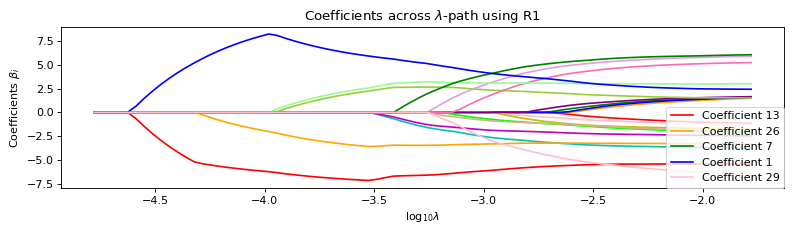

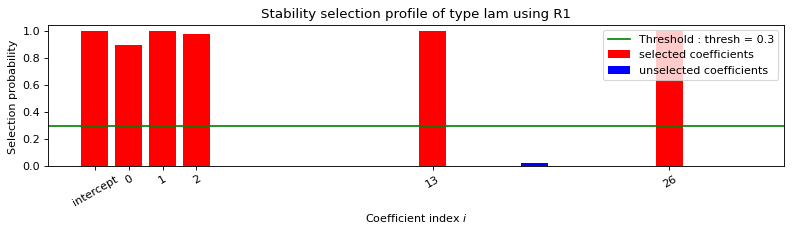

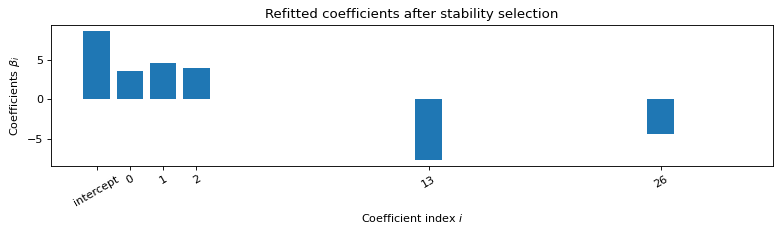


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.051s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.57  4.57  3.92  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.63  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.43  0.    0.    0.  ]
Error: 3281.08

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


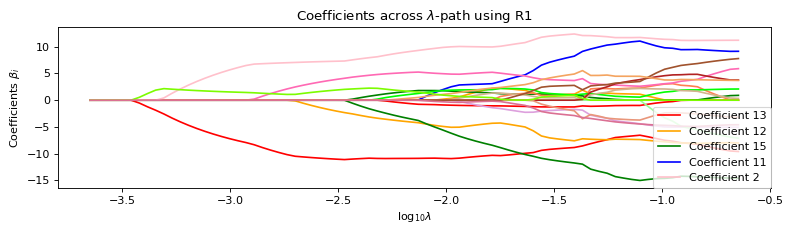

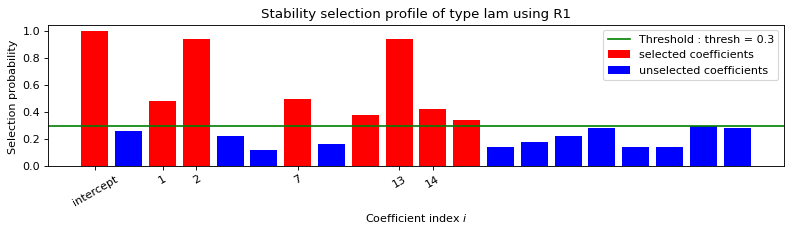

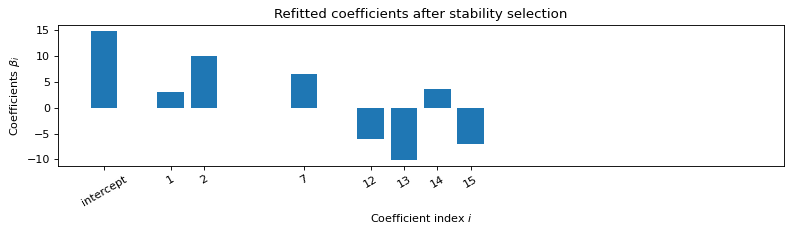


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    12    13    14    15    
   Running time :  0.093s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     3.04  10.06   0.     0.     0.     0.     6.46   0.     0.
   0.     0.    -6.13 -10.03   3.57  -6.97   0.     0.     0.     0.
   0.     0.     0.     0.     0.     0.     0.     0.     0.     0.  ]
Error: 3420.94

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


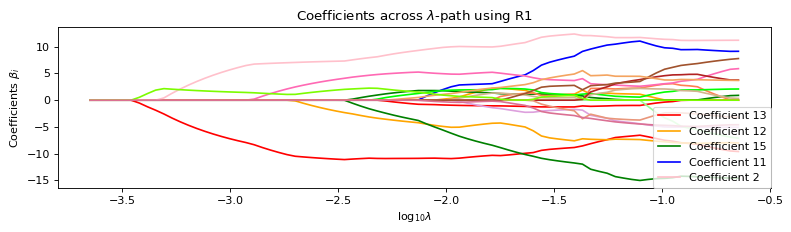

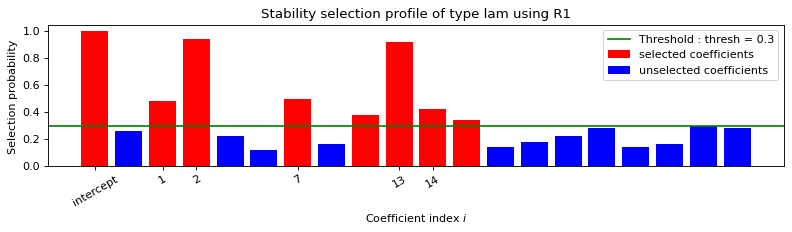

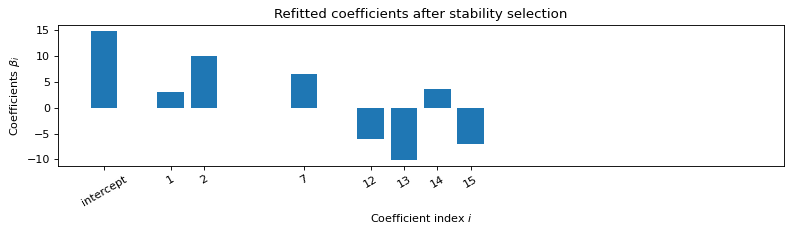

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.007s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    12    13    14    15    
   Running time :  0.077s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-2.15 -6.98  3.78  2.93  2.39  2.02 -4.29  2.31  2.06  1.86  1.7   7.46
 10.66 -3.22  7.2   0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.    0.    0.    0.  ]
Error: 3420.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.21915256]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99572545]...
INFO:absl:Predict treatment effect...


Error: 884.81

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3372.75

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3669.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 15

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                   -1119.939
Model:                         IV2SLS   Adj. R-squared:              -1189.103
Method:                     Two Stage   F-statistic:                  0.003582
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:01:10                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1570.9103        nan        nan        n

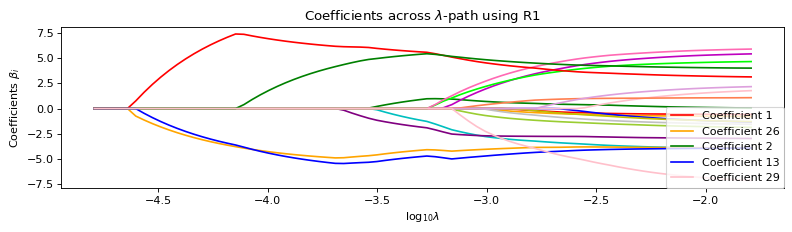

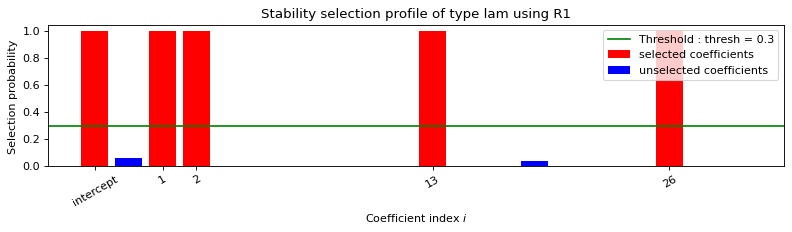

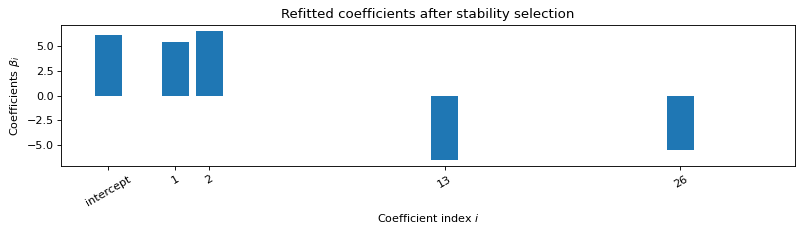


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    13    26    
   Running time :  0.055s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    5.47  6.53  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.47  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.53  0.    0.    0.  ]
Error: 3358.43

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


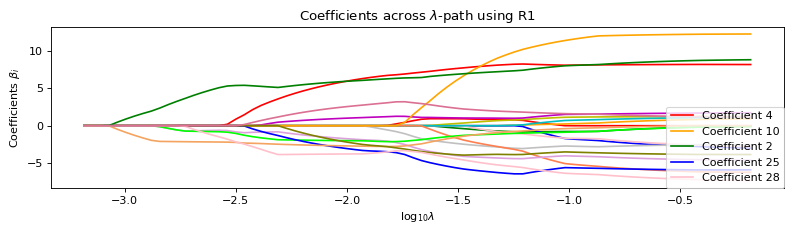

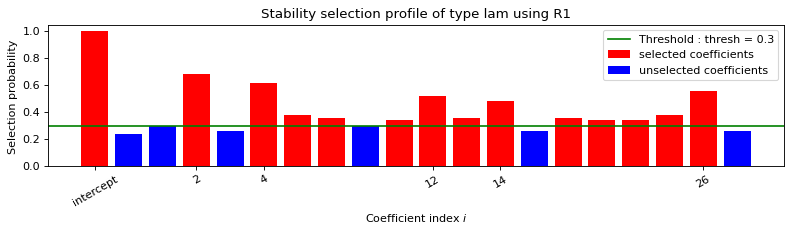

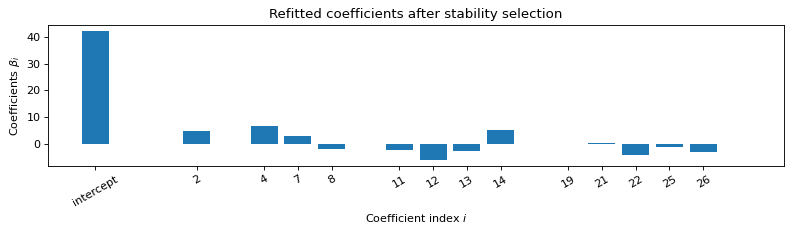


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    4    7    8    11    12    13    14    19    21    22    25    26    
   Running time :  0.123s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    0.    4.8   0.    6.84  0.    0.    2.99 -1.72  0.    0.   -2.26
 -5.82 -2.53  5.37  0.    0.    0.    0.    0.09  0.    0.3  -3.93  0.
  0.   -1.02 -3.12  0.    0.    0.  ]
Error: 1651.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


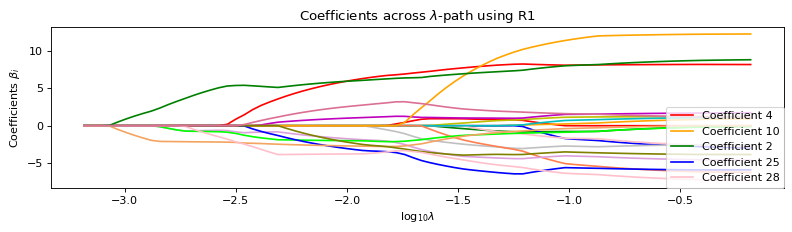

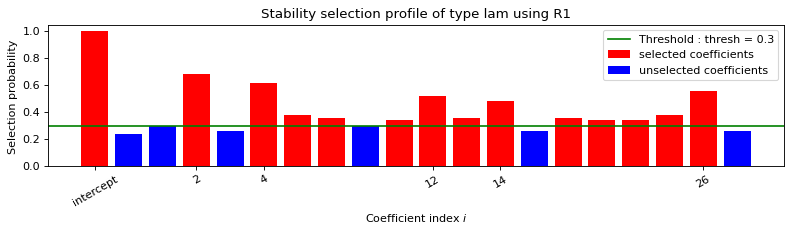

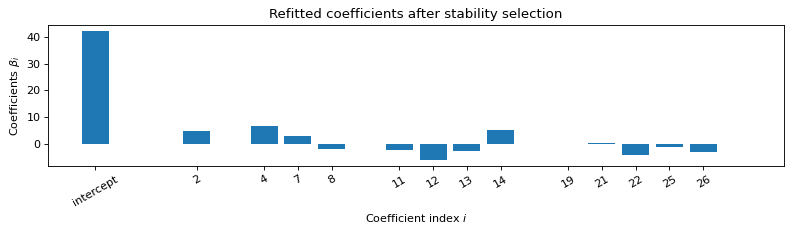

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    4    7    8    11    12    13    14    19    21    22    25    26    
   Running time :  0.111s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.   -3.92  1.39 -5.04  2.13  1.8  -1.24  3.35  1.36  1.23  3.29  6.44
  2.79 -5.03  0.5   0.47  0.44  0.41  0.3   0.38  0.06  4.2   0.18  0.17
  1.16  3.18  0.    0.    0.  ]
Error: 1651.82

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.26276782]...
INFO:absl:Optimize xi...
INFO:absl:Optimal xi [-1.98573227]...
INFO:absl:Predict treatment effect...


Error: 777.6

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3366.07

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 1963.93

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -99.389
Model:                         IV2SLS   Adj. R-squared:               -105.583
Method:                     Two Stage   F-statistic:                 0.0004785
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:02:47                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -54.0144        nan        nan        n

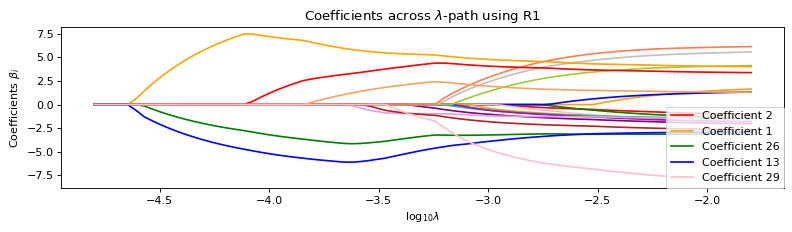

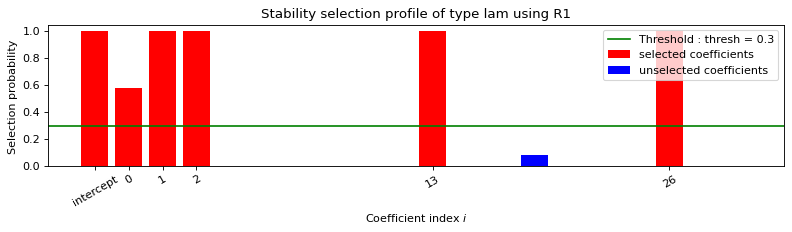

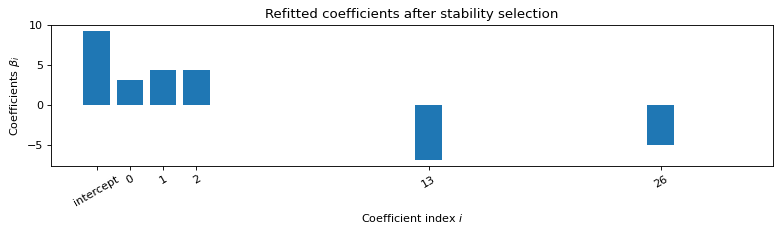


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.049s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.13  4.33  4.37  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.86  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.97  0.    0.    0.  ]
Error: 3639.24

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


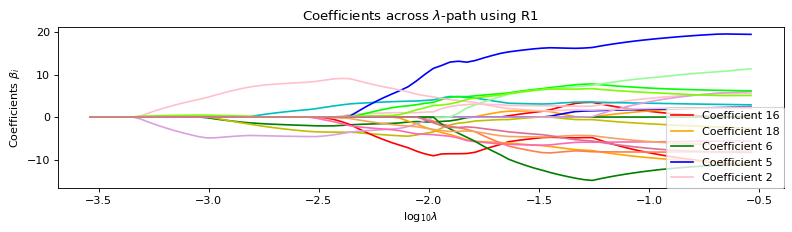

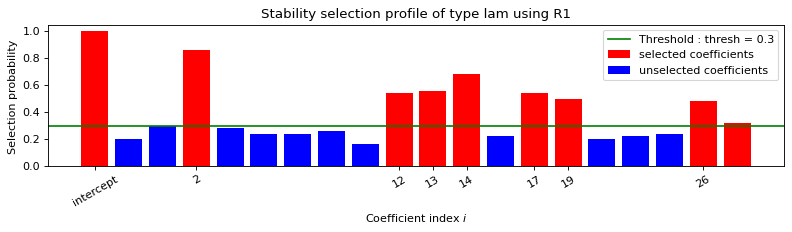

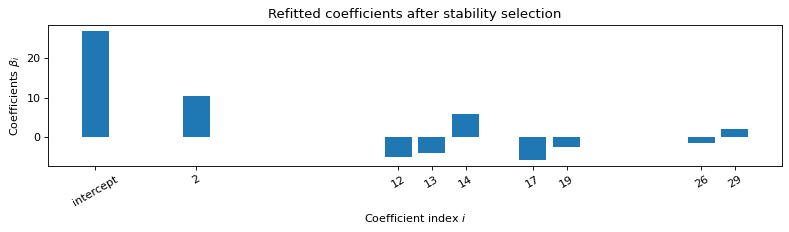


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    12    13    14    17    19    26    29    
   Running time :  0.081s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    0.   10.49  0.    0.    0.    0.    0.    0.    0.    0.    0.
 -5.07 -3.94  5.99  0.    0.   -5.65  0.   -2.44  0.    0.    0.    0.
  0.    0.   -1.54  0.    0.    2.16]
Error: 2811.23

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


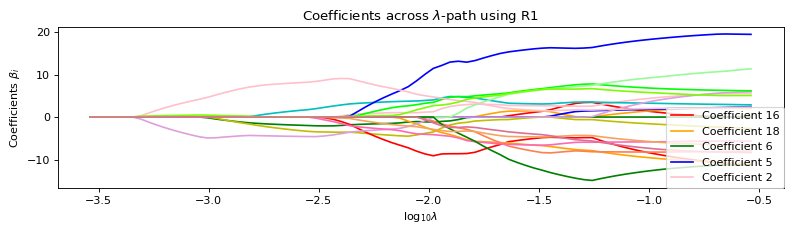

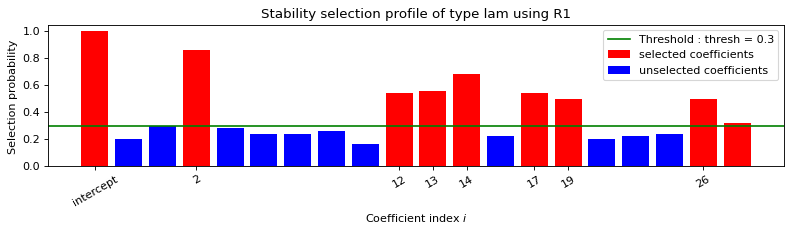

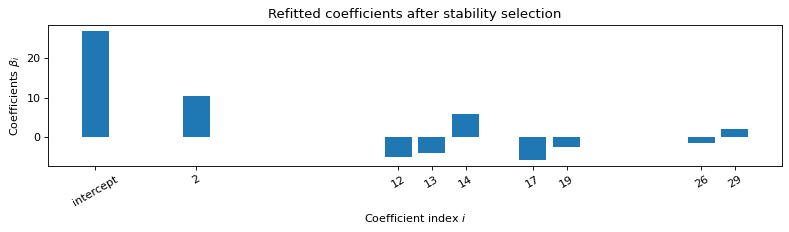

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    2    12    13    14    17    19    26    29    
   Running time :  0.087s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.   -8.57  3.03  2.35  1.92  1.62  1.4   1.24  1.11  1.    0.91  5.71
  4.2  -5.69  0.48  0.45  5.92  0.1   2.47 -0.03 -0.03 -0.03 -0.03 -0.03
 -0.02  1.49 -0.08 -0.08 -2.19]
Error: 2811.02

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.45325412]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99572698]...
INFO:absl:Predict treatment effect...


Error: 899.9

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3677.1

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3975.8

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                     -16.355
Model:                         IV2SLS   Adj. R-squared:                -17.425
Method:                     Two Stage   F-statistic:                -0.0001718
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:04:15                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -35.0295        nan        nan        n

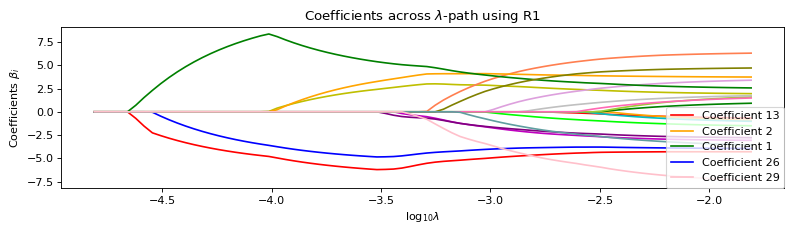

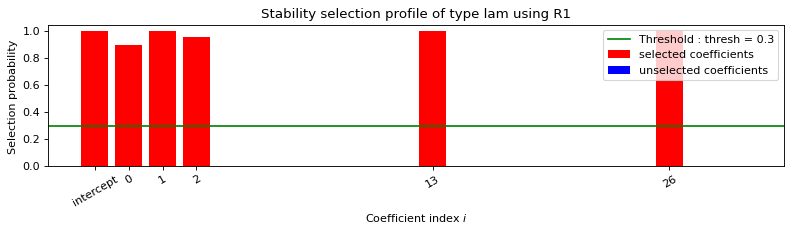

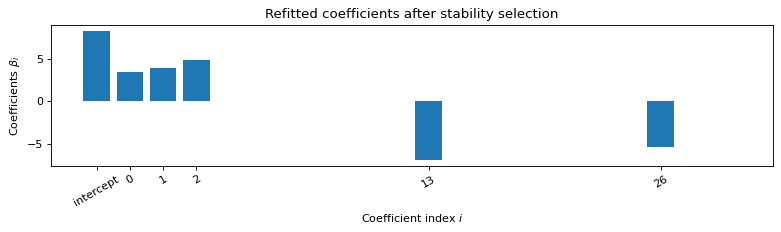


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.004s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.05s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.49  3.92  4.88  0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -6.87  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -5.43  0.    0.    0.  ]
Error: 3426.98

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


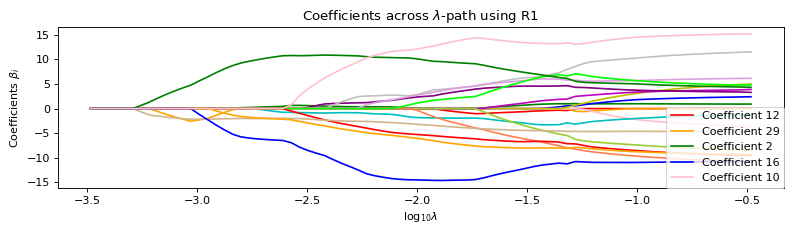

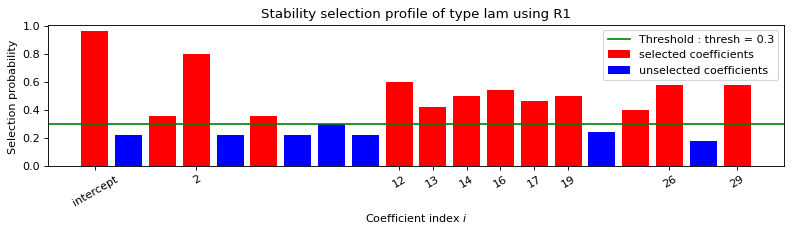

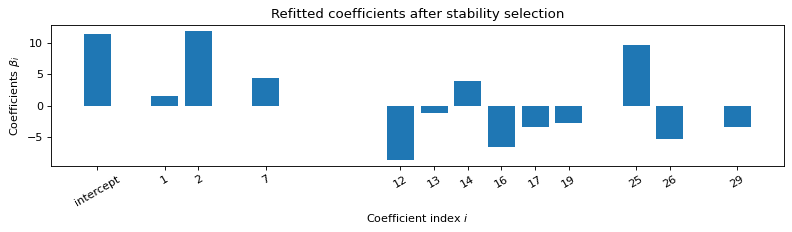


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    12    13    14    16    17    19    25    26    29    
   Running time :  0.092s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 0.    1.57 11.84  0.    0.    0.    0.    4.44  0.    0.    0.    0.
 -8.59 -1.26  3.84  0.   -6.56 -3.35  0.   -2.8   0.    0.    0.    0.
  0.    9.56 -5.32  0.    0.   -3.38]
Error: 3259.58

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


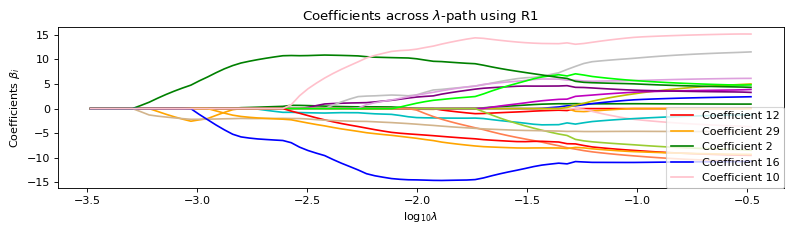

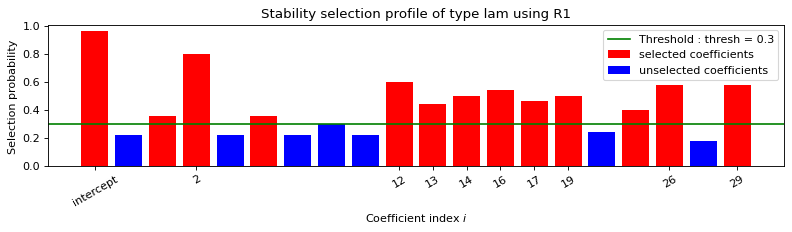

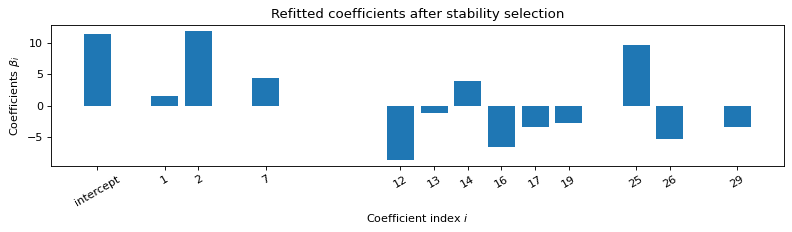

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.008s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    2    7    12    13    14    16    17    19    25    26    29    
   Running time :  0.095s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-1.11 -9.03  3.87  3.    2.45  2.07 -2.36  2.1   1.88  1.7   1.55  9.68
  1.9  -3.16  0.77  7.09  3.56  0.1   2.83 -0.04 -0.04 -0.04 -0.04 -0.04
 -9.41  5.55  0.12  0.12  3.44]
Error: 3259.58

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [1.93194571]...
INFO:absl:Optimize xi...
INFO:absl:KIV2 minimization did not succeed.
INFO:absl:Optimal xi [-2.99573227]...
INFO:absl:Predict treatment effect...


Error: 853.18

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3349.43

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 3050.14

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 13

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                      -0.259
Model:                         IV2SLS   Adj. R-squared:                 -0.337
Method:                     Two Stage   F-statistic:                    0.1196
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:05:43                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -26.9989   1.16e+08  -2.32e-07      1.0

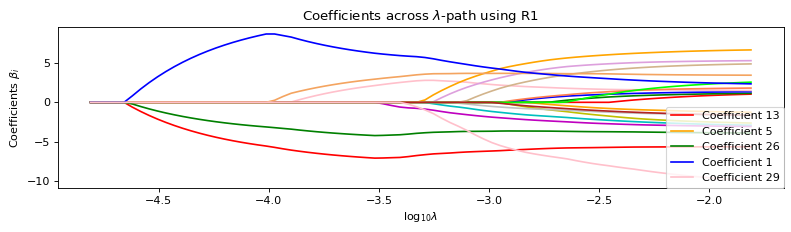

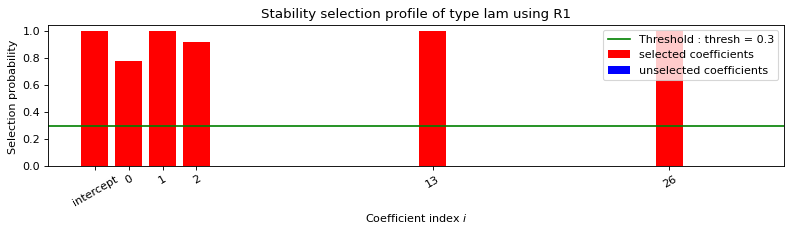

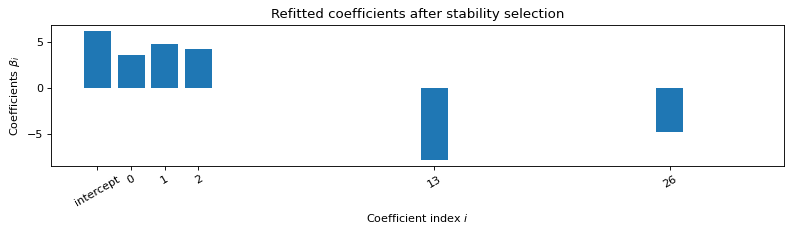


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.006s

 STABILITY SELECTION : 
   Selected variables :  intercept    0    1    2    13    26    
   Running time :  0.048s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [ 3.61  4.75  4.2   0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.   -7.78  0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
  0.    0.   -4.78  0.    0.    0.  ]
Error: 4064.08

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Dirichlet + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Dirichlet Regression not tried for performance reasons.
---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR + Log Contrast >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


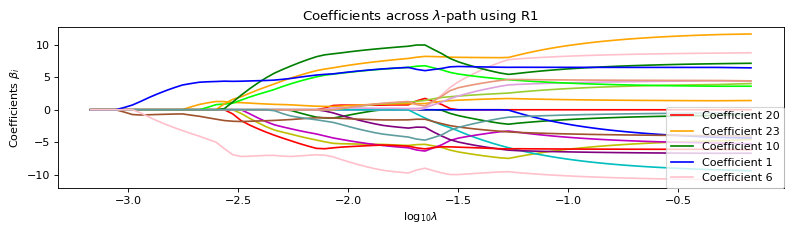

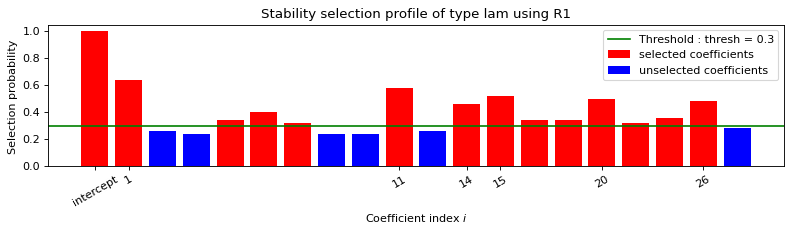

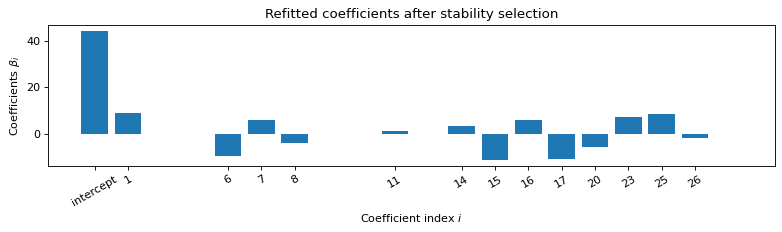


 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    6    7    8    11    14    15    16    17    20    23    25    26    
   Running time :  0.114s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [  0.     9.03   0.     0.     0.     0.    -9.23   5.97  -3.72   0.
   0.     1.33   0.     0.     3.6  -10.93   6.24 -10.83   0.     0.
  -5.38   0.     0.     7.12   0.     8.44  -1.66   0.     0.     0.  ]
Error: 3264.28

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< ALR MODEL>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


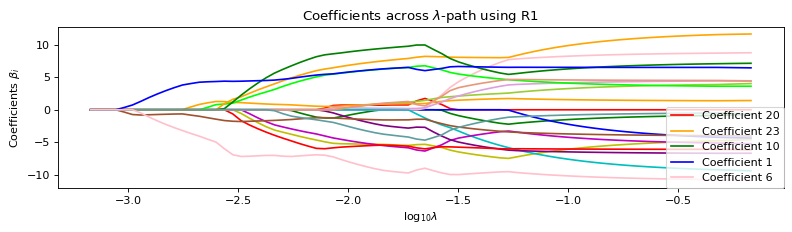

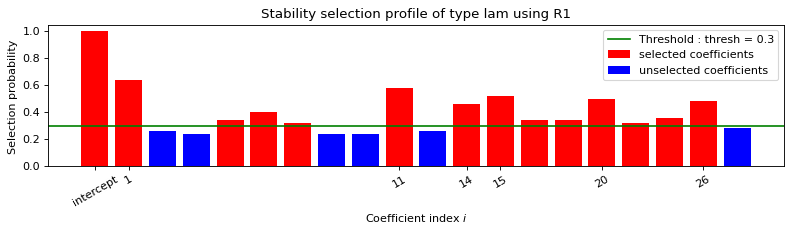

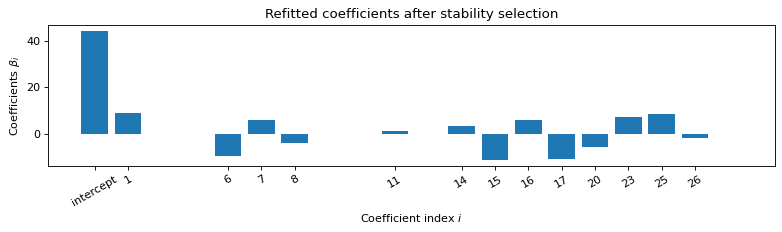

INFO:absl:Setup matrices...



 PATH COMPUTATION : 
 There is also an intercept.  
   Running time :  0.005s

 STABILITY SELECTION : 
   Selected variables :  intercept    1    6    7    8    11    14    15    16    17    20    23    25    26    
   Running time :  0.112s

True Beta: [-5. -5. -5. -5.  5.  5.  5.  5.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
Estimated Beta: [-6.39  3.69  2.61  2.02  1.65  9.94 -5.61  4.18  0.22  0.2  -1.09  0.27
  0.25 -3.25 11.03 -6.29 10.65 -0.46 -0.44  4.83 -0.65 -0.62 -7.56 -0.28
 -8.54  1.7   0.    0.    0.  ]
Error: 3264.28

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>


INFO:absl:Optimize lambda...
INFO:absl:Optimal lambda [2.1469957]...
INFO:absl:Optimize xi...
INFO:absl:Optimal xi [-1.98573227]...
INFO:absl:Predict treatment effect...


Error: 932.05

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< ONLY SECOND STAGE - Kernel Regression KIV >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4063.09

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - Kernel Regression KIV (manual) >>>>>>>>>>>>>>>>>>>>>>>>>
Error: 4700.42

---------------------------------------------------------------------------------------------
<<<<<<<<<<<<<<<<<<<<<<<<<<<<< 2SLS - ILR ILR Regression Implementation >>>>>>>>>>>>>>>>>>>>>>>


/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/base/model.py:1832: ValueWarning:

covariance of constraints does not have full rank. The number of constraints is 29, but rank is 9

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1817: RuntimeWarning:

invalid value encountered in sqrt



                          IV2SLS Regression Results                           
Dep. Variable:                      y   R-squared:                      -6.201
Model:                         IV2SLS   Adj. R-squared:                 -6.646
Method:                     Two Stage   F-statistic:                 0.0006814
                        Least Squares   Prob (F-statistic):               1.00
Date:                 Di, 03 Aug 2021                                         
Time:                        06:07:12                                         
No. Observations:                 500                                         
Df Residuals:                     470                                         
Df Model:                          29                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         25.7611        nan        nan        n

In [16]:
today = datetime.now()


is_negbinom = (param.strRel == "negbinom")
num_iteration = 20 if is_negbinom else 50
is_nonlinear = (param.strRel == "nonlinear")

df_beta, df_mse, mse_large_confidence= run_methods_confidence_interval(
    param.key, num_iteration, 
    param.n, param.p, param.num_inst, param.mu_c, param.c_X, 
    param.alpha0, param.alphaT, param.c_Y, param.beta0, param.betaT, 
    is_nonlinear=is_nonlinear, is_negbinom=is_negbinom,
    num_star=250)

## Save results

For convenience and runtime purpose, we save the data in the temp folder.

In [17]:
import pickle
results = {
    "df_mse": df_mse,
    "df_beta": df_beta,
    "mse_large": mse_large_confidence
}

with open(os.path.join(os.getcwd(),"temp", "results.pickle"), "wb") as f:
    pickle.dump(results, f)
    f.close()


In [18]:
with open(os.path.join(os.getcwd(),"temp", "results.pickle"), "rb") as f:
    results = pickle.load(f)
    df_mse = results["df_mse"]
    df_beta = results["df_beta"]
    f.close()

# Generation of final plots

## Out of sample MSE plots

In [19]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR"]
fig = plot_mse_results(df_mse, filter_list)

# depending on outliers in the ILR+ILR method, you can update the axes ranges here
fig.update_yaxes(range=(0, 100000))
fig.show()

In [20]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC"]

fig = plot_mse_results(df_mse, filter_list)
# depending on outliers in the ILR+ILR method, you can update the axes ranges here
fig.update_yaxes(range=(0, 100000))
fig.show()

In [21]:
filter_list = ["ALR+LC", "DIR+LC", "ONLY Second LC"]

fig = plot_mse_results(df_mse, filter_list, sort_to_filter=True)
fig.show()

/opt/anaconda3/envs/gen_iv_models_stripped/lib/python3.8/site-packages/pandas/core/generic.py:5170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## True $\beta$ vs. estimated $\beta$s.

### Influential $\beta$ values

In [22]:
filter_list = ["ALR+LC", "DIR+LC", "ONLY Second LC"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.show()

In [23]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True)
fig.update_layout(showlegend=False)
fig.update_layout(width=2000, height=500)
fig.show()

### Non-influential $\beta$ values

In [24]:
filter_list = ["ALR+LC", "DIR+LC", "ONLY Second LC"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True, beta_zero=True)
fig.update_layout(showlegend=False)
fig.show()

In [25]:
filter_list = ["ALR+LC", "ILR+LC", "ILR+ILR", "DIR+LC",  "ONLY Second LC", "ONLY Second ILR"]
fig = plot_beta_results(df_beta, param.betaT, filter_list, sort_to_filter=True, beta_zero=True)
fig.update_layout(showlegend=False)
fig.update_layout(width=2000, height=500)
fig.show()